# Hyperspectral Image Analysis - EDA of original training image

Aim: Image Reconstruction aims to enhance hyperspectral images by removing noise, artifacts, and imperfections. It results in cleaner, higher-quality representations of the scene, reducing distortions. This is crucial for applications requiring high spatial resolution, like remote sensing and object detection. Subtle details, previously indistinct, become more discernible in the process. While image reconstruction primarily focuses on enhancing the spatial quality of the image, spectral analysis ensures that the spectral signatures of materials and objects in the scene remain intact. Spectral signatures are unique patterns of reflectance or emission at different

In [ ]:
!pip install tensorboardX torchnet --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 1.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 30.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/SSPSR-master/

Mounted at /content/drive
/content/drive/.shortcut-targets-by-id/1fATmwNxtREPPUjrMr0I-xs09fm47ZixA/SSPSR-master


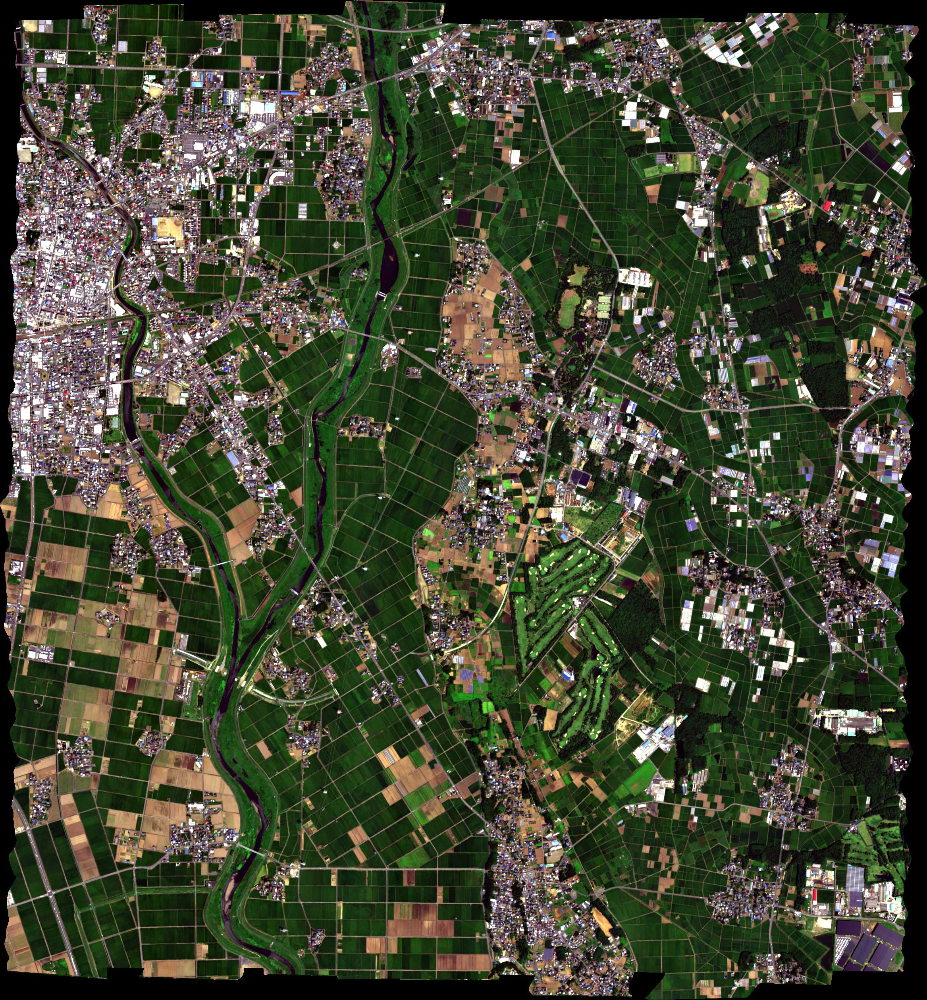

In [ ]:
# Original Image for which we are trying to obtain superresolution
from IPython.display import Image
Image(filename='Chikusei.jpg')

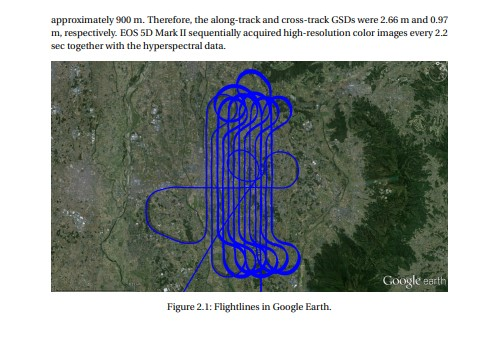

In [ ]:
# How above data was collected
from IPython.display import Image
Image(filename='data/datacollection.jpg')

The hyperspectral data was acquired using a Hyperspec-VNIR-C imaging sensor and a Canon EOS 5D Mark II camera. The hyperspectral sensor recorded 512 bands in 12-bit DN (Digital Number) values. Data processing steps included radiometric correction, geometric correction, atmospheric correction, and BRDF correction. The final mosaic data consists of 2517 × 2335 pixels.

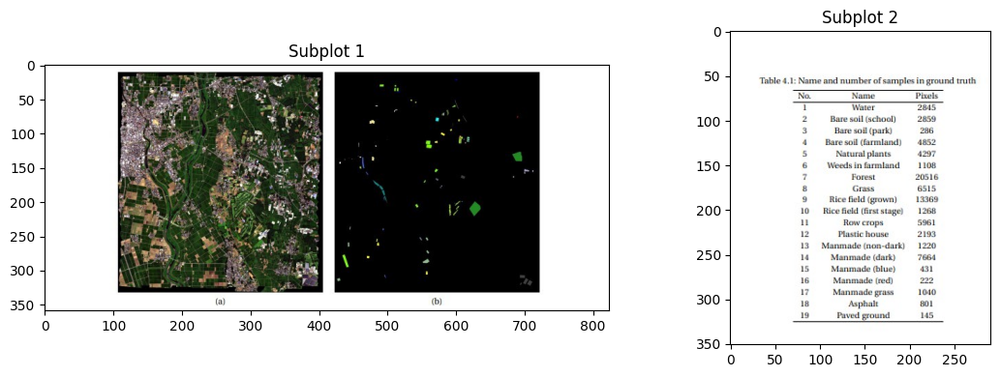

In [ ]:
# Entire data in different forms
import matplotlib.pyplot as plt
from matplotlib.image import imread

image1 = imread('data/entiredata.jpg')
image2 = imread('data/gt.jpg')

# Create a figure with two subplots side by side
plt.figure(figsize=(12, 4))  # Adjust the figure size as needed

# First subplot
plt.subplot(1, 2, 1)  # 1 row, 2 columns, select the first subplot
plt.imshow(image1)  # Display the first image
plt.title('Subplot 1')  # Set a title for the first subplot

# Second subplot
plt.subplot(1, 2, 2)  # 1 row, 2 columns, select the second subplot
plt.imshow(image2)  # Display the second image
plt.title('Subplot 2')  # Set a title for the second subplot

plt.tight_layout()  # Ensure proper spacing between subplots
plt.show()

The Color Composite Image is shown in Fig(a) and ground truth is shown in Fig(b) and the names and numbers of ground truth pixels are listed in Table1.

## Read the Data

In [ ]:
from scipy.io import loadmat
import h5py

def read_HSI():
  with h5py.File('data/Chikusei_MATLAB/HyperspecVNIR_Chikusei_20140729.mat', 'r') as file:
        X = file['chikusei'][:]
  # X = loadmat('HyperspecVNIR_Chikusei_20140729.mat')
  y = loadmat('data/Chikusei_MATLAB/HyperspecVNIR_Chikusei_20140729_Ground_Truth.mat')['GT']
  return X, y

X, y = read_HSI()

In [ ]:
print(f"X shape: {X.shape}\ny shape: {y.shape}")

X shape: (128, 2335, 2517)
y shape: (1, 1)


128 - Each element along this dimension represents the intensity or reflectance of the hyperspectral data at a specific wavelength or spectral band.

2335 - Corresponds to the number of pixels or samples taken along the flight path or the sensor's movement direction.

2517 - Corresponds to the number of pixels or samples taken perpendicular to the flight path or sensor's movement direction.

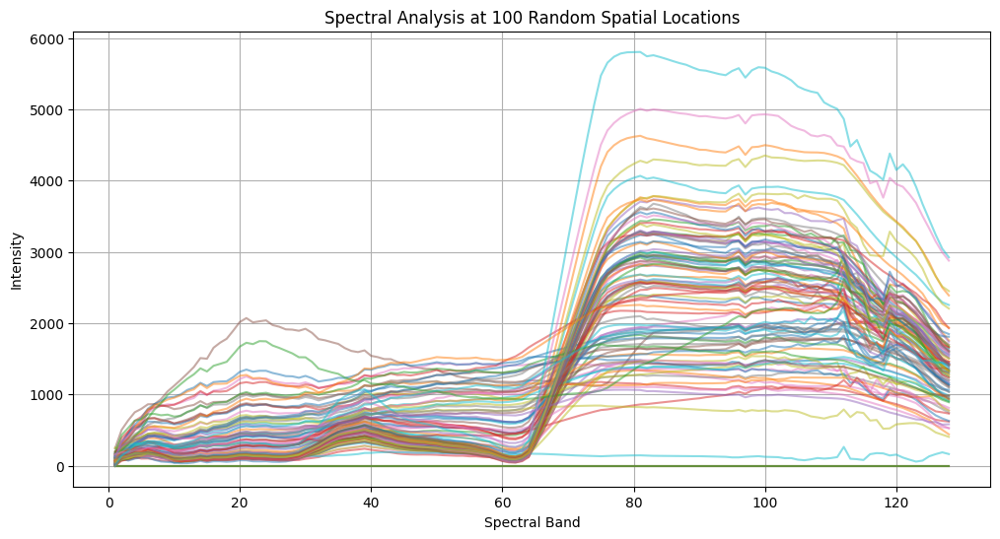

In [ ]:
# Spectral Freq analysis for randomly selected pixels
import matplotlib.pyplot as plt
import numpy as np

# Select a random subset of x and y coordinates
num_samples = 100  # You can adjust this number as needed
random_x = np.random.randint(0, X.shape[1], num_samples)
random_y = np.random.randint(0, X.shape[2], num_samples)

plt.figure(figsize=(12, 6))

# Plot spectral profiles for the selected subset of coordinates
for i in range(num_samples):
    x, y = random_x[i], random_y[i]
    spectral_profile = X[:, x, y]
    plt.plot(range(1, len(spectral_profile) + 1), spectral_profile, alpha=0.5)

plt.xlabel('Spectral Band')
plt.ylabel('Intensity')
plt.title('Spectral Analysis at 100 Random Spatial Locations')
plt.grid()
plt.show()

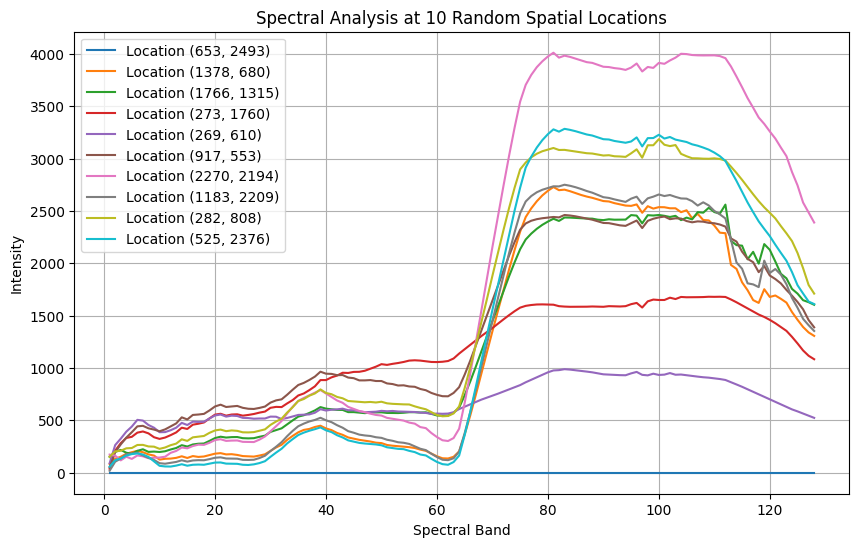

In [ ]:
# Spectral Profile Analysis
import matplotlib.pyplot as plt
import numpy as np

# Define the number of random locations to plot
num_locations = 10

# Generate random x and y coordinates for the specified number of locations
random_x = np.random.randint(0, X.shape[1], num_locations)
random_y = np.random.randint(0, X.shape[2], num_locations)

plt.figure(figsize=(10, 6))

# Plot spectral profiles for each random location
for i in range(num_locations):
    x, y = random_x[i], random_y[i]
    spectral_profile = X[:, x, y]
    plt.plot(range(1, len(spectral_profile) + 1), spectral_profile, label=f'Location {x,y}')

plt.xlabel('Spectral Band')
plt.ylabel('Intensity')
plt.title('Spectral Analysis at 10 Random Spatial Locations')
plt.legend()
plt.grid()
plt.show()

 At one end, you have lower-frequency, longer-wavelength radiation such as radio waves and microwaves. At the other end, you have higher-frequency, shorter-wavelength radiation such as X-rays and gamma rays. In between, you have the visible and infrared regions.

The data's capability to capture both low and high-frequency information makes it suitable for a wide range of applications. For example, the low-frequency bands can be used for tasks like vegetation analysis, land cover classification, and water body detection, while the high-frequency bands can support applications like mineral exploration, temperature monitoring, and identifying specific chemical compounds.

Conclusion: Statistical t-tests provide insights into spectral band behavior in hyperspectral data. Significant differences (p < 0.05) identify distinct bands, while nonsignificant comparisons (p >= 0.05) highlight similar bands, aiding feature selection and data understanding.

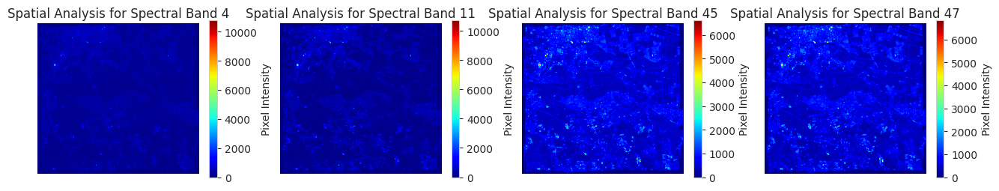

In [ ]:
# Spatial distribution of pixel intensities for a RGB band selected
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
sns.axes_style('whitegrid')
fig = plt.figure(figsize = (16, 6))
q = [4,11,45,47]
for i in range(0, 4):
    fig.add_subplot(2,4, i+1)
    # q = np.random.randint(X.shape[0])
    plt.imshow(X[q[i],:,:], cmap='jet')
    plt.colorbar(label='Pixel Intensity')
    plt.axis('off')
    plt.title(f'Spatial Analysis for Spectral Band {q[i]}')

# Data Preprocessing in MATLAB:
We initially crop the central region of the image to obtain a subimage with dimensions of 2304×2048×128 pixels. This subimage is then divided into training and test data. The top region of this subimage forms the testing data, comprising four non-overlapping hyperspectral images with dimensions of 512×512×128 pixels. For the training set, we extract overlapping patches from the remaining subimage region to serve as reference high-resolution hyperspectral images. When the upsampling factor d is 4, we set the patch size to 64×64 pixels with a 32-pixel overlap. This choice of different block sizes is based on considerations such as maintaining sufficient input information for effective training, especially for larger upsampling factors. Notably, the low-resolution hyperspectral images are generated through Bicubic downsampling, using the Matlab function "imresize," from the ground truth with a factor of 4.

Bicubic Interpolation: Method for estimating pixel values at non-grid positions within an image by considering a 4x4 grid of nearby pixels and using a weighted averaging technique based on a cubic polynomial function.

In summary, After normalizing data and central cropping original image to generate ms(low_res(16,16)), ms_bicubic(high_res(64,64)) and gt images by creating patches of original Chikusei image by size of 64 and resizing to 16(ms) and 64(ms_bicubic). Now let's do EDA on 3700 training samples generated.

In [ ]:
!pip install tensorboardX torchnet --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 10.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
import scipy.io
mat_file_path = 'dataset/Chikusei_x4/trains/train/block_Chikusei_train_1.mat'
# mat_file_path = 'dataset/Chikusei_x4/tests/Chikusei_test.mat'
mat_data = scipy.io.loadmat(mat_file_path)
image_data_ms = mat_data['ms']
image_data_msb = mat_data['ms_bicubic']
image_data_gt = mat_data['gt']
print(image_data_ms.shape)
print(image_data_msb.shape)
print(image_data_gt.shape)

(16, 16, 128)
(64, 64, 128)
(64, 64, 128)


# Visualization of Spectral signatures for random image

<ipython-input-9-0784f7947212>:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])


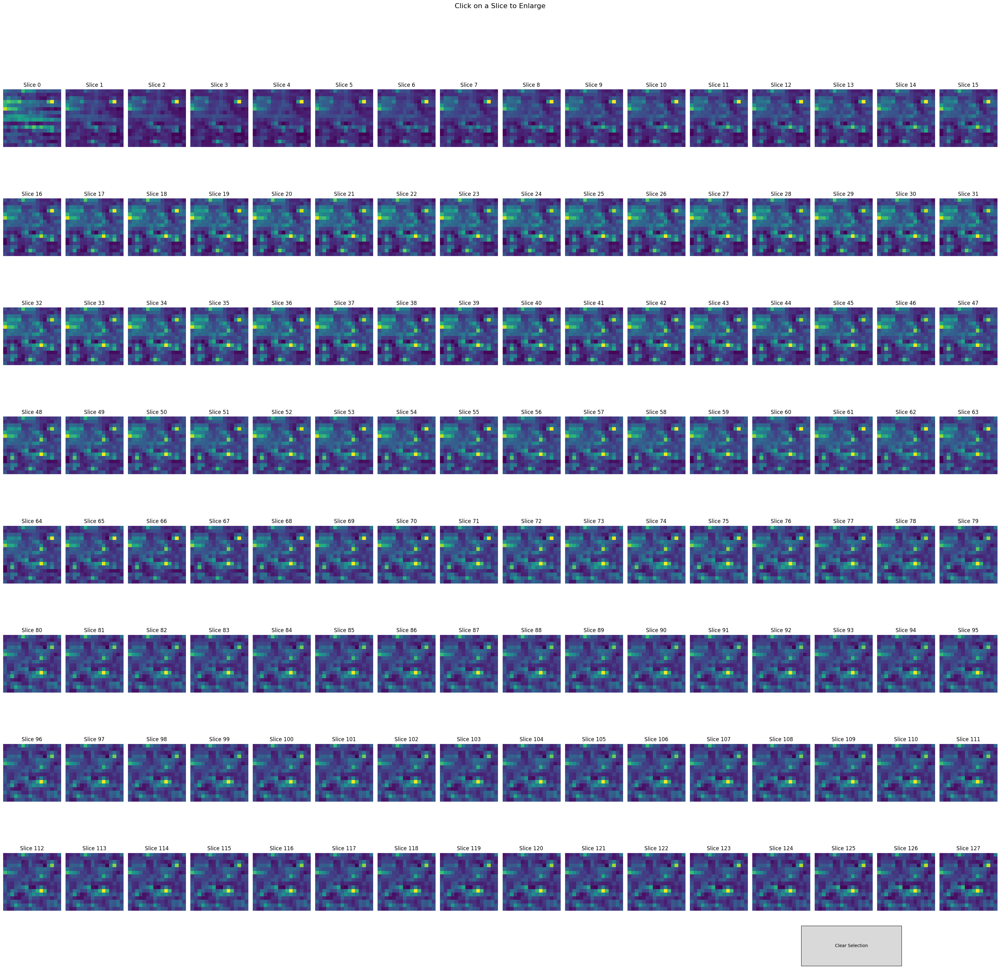

In [ ]:
# ms plot
import matplotlib.pyplot as plt
from matplotlib.widgets import Button

# Determine the number of rows and columns for the grid of subplots
num_slices = image_data_ms.shape[2]
num_rows = (num_slices - 1) // 16 + 1  # Calculate the number of rows
num_cols = min(num_slices, 16)         # Limit the number of columns to 16

# Create a figure with subplots for each slice
fig, axes = plt.subplots(num_rows, num_cols, figsize=(32, 32))
fig.suptitle('Click on a Slice to Enlarge', fontsize=16)

# Initialize a variable to store the currently selected slice
selected_slice_index = None

# Function to handle slice click event
def on_slice_click(event):
    global selected_slice_index
    if event.inaxes:
        row, col = event.inaxes.get_subplotspec().get_active_rows_columns()
        selected_slice_index = row * num_cols + col
        enlarge_figure(selected_slice_index)

# Attach the click event handler to each subplot
for slice_index in range(num_slices):
    row = slice_index // num_cols  # Calculate row index
    col = slice_index % num_cols   # Calculate column index

    # Plot the slice
    im = axes[row, col].imshow(image_data_ms[:, :, slice_index], cmap='viridis')
    axes[row, col].set_title(f'Slice {slice_index}')
    axes[row, col].axis('off')  # Turn off axis labels and ticks
    axes[row, col].format_coord = lambda x, y: f'Slice {slice_index}'  # Display slice index when hovering

    # Add an event handler for click events
    im.figure.canvas.mpl_connect('button_press_event', on_slice_click)

# Enlarge the selected slice when clicked
def enlarge_figure(slice_index):
    if slice_index is not None:
        plt.figure(figsize=(16, 16))
        plt.imshow(image_data_msb[:, :, slice_index], cmap='viridis')
        plt.title(f'Enlarged Slice {slice_index}')
        plt.colorbar()
        plt.show()

# Create a button to clear the selected slice
def clear_selection(event):
    global selected_slice_index
    selected_slice_index = None

clear_button_ax = fig.add_axes([0.8, 0.02, 0.1, 0.04])
clear_button = Button(clear_button_ax, 'Clear Selection')
clear_button.on_clicked(clear_selection)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

<ipython-input-11-48438f076a44>:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])


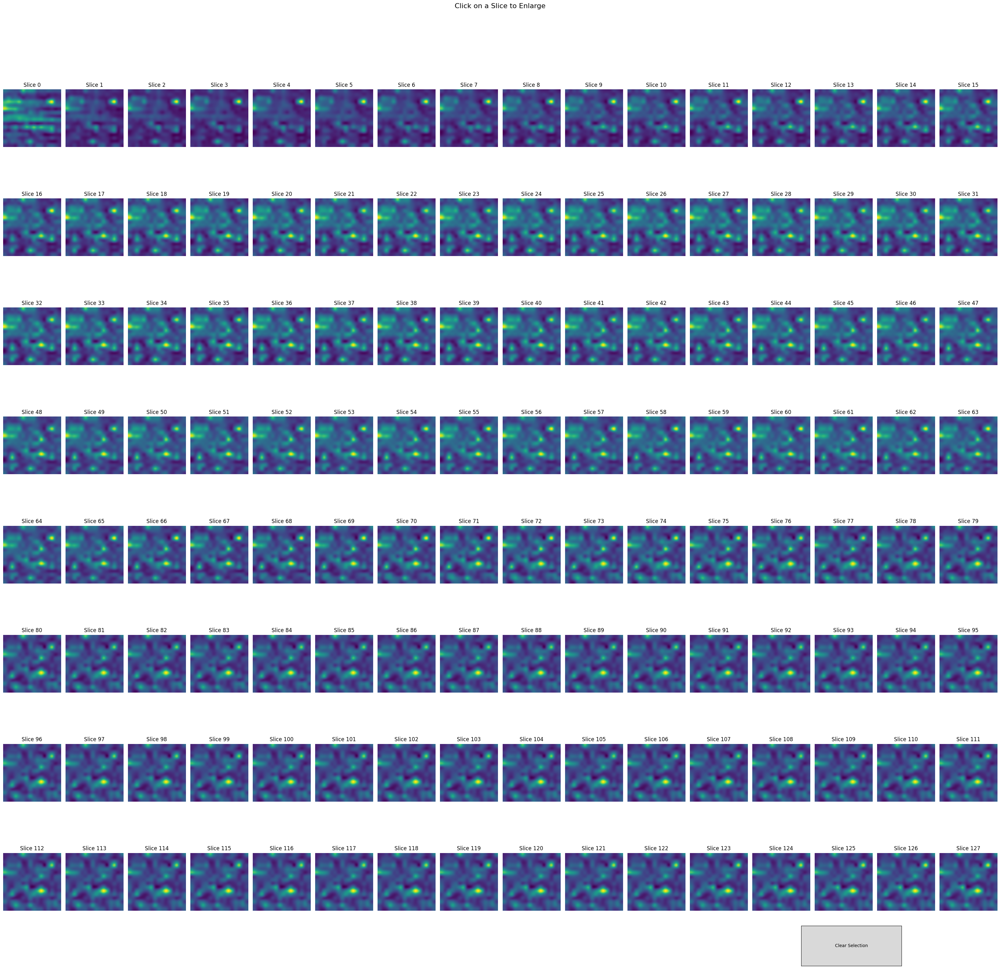

In [ ]:
# ms_bicubic plot
import matplotlib.pyplot as plt
from matplotlib.widgets import Button

# Determine the number of rows and columns for the grid of subplots
num_slices = image_data_msb.shape[2]
num_rows = (num_slices - 1) // 16 + 1  # Calculate the number of rows
num_cols = min(num_slices, 16)         # Limit the number of columns to 16

# Create a figure with subplots for each slice
fig, axes = plt.subplots(num_rows, num_cols, figsize=(32, 32))
fig.suptitle('Click on a Slice to Enlarge', fontsize=16)

# Initialize a variable to store the currently selected slice
selected_slice_index = None

# Function to handle slice click event
def on_slice_click(event):
    global selected_slice_index
    if event.inaxes:
        row, col = event.inaxes.get_subplotspec().get_active_rows_columns()
        selected_slice_index = row * num_cols + col
        enlarge_figure(selected_slice_index)

# Attach the click event handler to each subplot
for slice_index in range(num_slices):
    row = slice_index // num_cols  # Calculate row index
    col = slice_index % num_cols   # Calculate column index

    # Plot the slice
    im = axes[row, col].imshow(image_data_msb[:, :, slice_index], cmap='viridis')
    axes[row, col].set_title(f'Slice {slice_index}')
    axes[row, col].axis('off')  # Turn off axis labels and ticks
    axes[row, col].format_coord = lambda x, y: f'Slice {slice_index}'  # Display slice index when hovering

    # Add an event handler for click events
    im.figure.canvas.mpl_connect('button_press_event', on_slice_click)

# Enlarge the selected slice when clicked
def enlarge_figure(slice_index):
    if slice_index is not None:
        plt.figure(figsize=(16, 16))
        plt.imshow(image_data_msb[:, :, slice_index], cmap='viridis')
        plt.title(f'Enlarged Slice {slice_index}')
        plt.colorbar()
        plt.show()

# Create a button to clear the selected slice
def clear_selection(event):
    global selected_slice_index
    selected_slice_index = None

clear_button_ax = fig.add_axes([0.8, 0.02, 0.1, 0.04])
clear_button = Button(clear_button_ax, 'Clear Selection')
clear_button.on_clicked(clear_selection)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

<ipython-input-12-d76bf6503c87>:56: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])


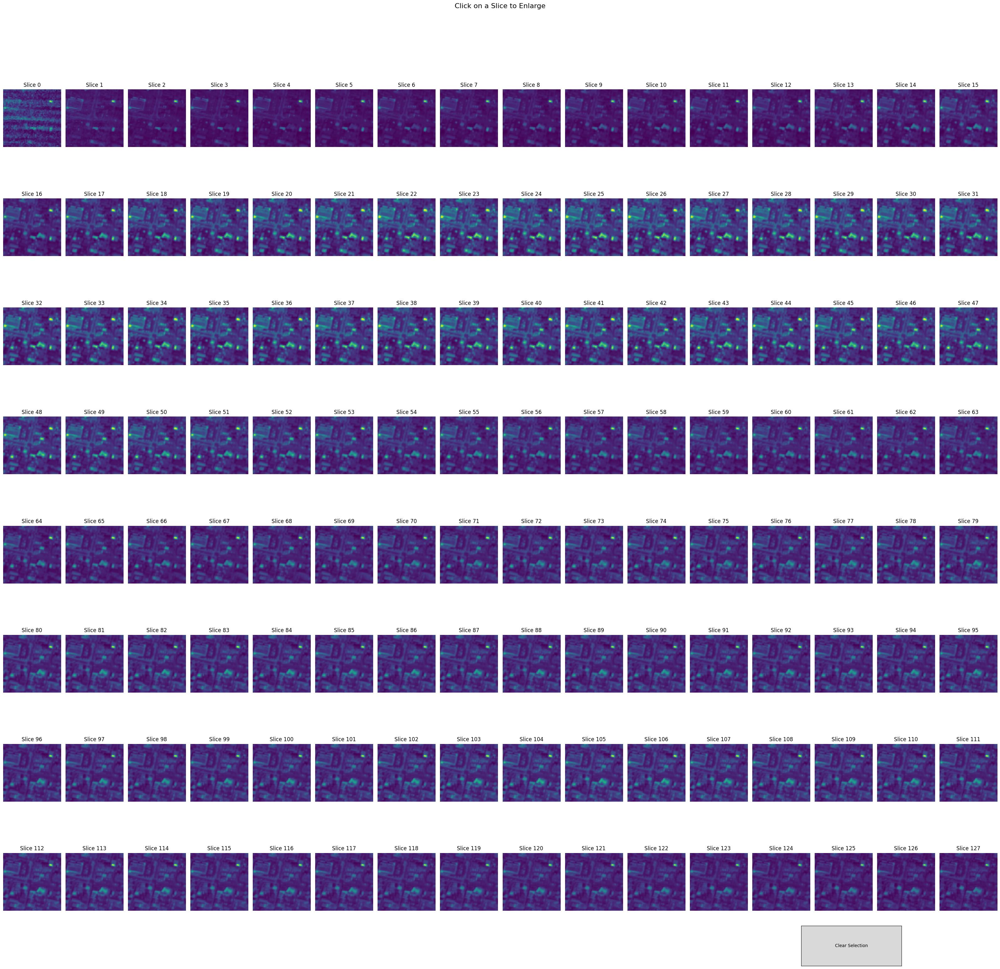

In [ ]:
# GT plot
import matplotlib.pyplot as plt
from matplotlib.widgets import Button

# Determine the number of rows and columns for the grid of subplots
num_slices = image_data_gt.shape[2]
num_rows = (num_slices - 1) // 16 + 1  # Calculate the number of rows
num_cols = min(num_slices, 16)         # Limit the number of columns to 16

# Create a figure with subplots for each slice
fig, axes = plt.subplots(num_rows, num_cols, figsize=(32, 32))
fig.suptitle('Click on a Slice to Enlarge', fontsize=16)

# Initialize a variable to store the currently selected slice
selected_slice_index = None

# Function to handle slice click event
def on_slice_click(event):
    global selected_slice_index
    if event.inaxes:
        row, col = event.inaxes.get_subplotspec().get_active_rows_columns()
        selected_slice_index = row * num_cols + col
        enlarge_figure(selected_slice_index)

# Attach the click event handler to each subplot
for slice_index in range(num_slices):
    row = slice_index // num_cols  # Calculate row index
    col = slice_index % num_cols   # Calculate column index

    # Plot the slice
    im = axes[row, col].imshow(image_data_gt[:, :, slice_index], cmap='viridis')
    axes[row, col].set_title(f'Slice {slice_index}')
    axes[row, col].axis('off')  # Turn off axis labels and ticks
    axes[row, col].format_coord = lambda x, y: f'Slice {slice_index}'  # Display slice index when hovering

    # Add an event handler for click events
    im.figure.canvas.mpl_connect('button_press_event', on_slice_click)

# Enlarge the selected slice when clicked
def enlarge_figure(slice_index):
    if slice_index is not None:
        plt.figure(figsize=(16, 16))
        plt.imshow(image_data_msb[:, :, slice_index], cmap='viridis')
        plt.title(f'Enlarged Slice {slice_index}')
        plt.colorbar()
        plt.show()

# Create a button to clear the selected slice
def clear_selection(event):
    global selected_slice_index
    selected_slice_index = None

clear_button_ax = fig.add_axes([0.8, 0.02, 0.1, 0.04])
clear_button = Button(clear_button_ax, 'Clear Selection')
clear_button.on_clicked(clear_selection)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [ ]:
from skimage.metrics import mean_squared_error, peak_signal_noise_ratio, structural_similarity

# Assuming 'ms_bicubic_data' and 'gt_data' are your MS_Bicubic and GT datasets as numpy arrays
# Ensure that both datasets have the same shape

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(image_data_gt, image_data_msb)

# Calculate Peak Signal-to-Noise Ratio (PSNR)
psnr = peak_signal_noise_ratio(image_data_gt, image_data_msb)

# Calculate Structural Similarity Index (SSIM)
ssim = structural_similarity(image_data_gt, image_data_msb, multichannel=True)

# Print the results
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Peak Signal-to-Noise Ratio (PSNR): {psnr:.2f} dB")
print(f"Structural Similarity Index (SSIM): {ssim:.2f}")

Mean Squared Error (MSE): 0.00
Peak Signal-to-Noise Ratio (PSNR): 30.98 dB
Structural Similarity Index (SSIM): 0.88


<ipython-input-13-7c76eb409094>:13: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = structural_similarity(image_data_gt, image_data_msb, multichannel=True)


In the context of super-resolution training, achieving low MSE, high PSNR, and high SSIM values means that the training data closely represents the high-resolution target images, and the model has the potential to learn how to reconstruct high-resolution images from lower-resolution inputs effectively.

# Model Architecture

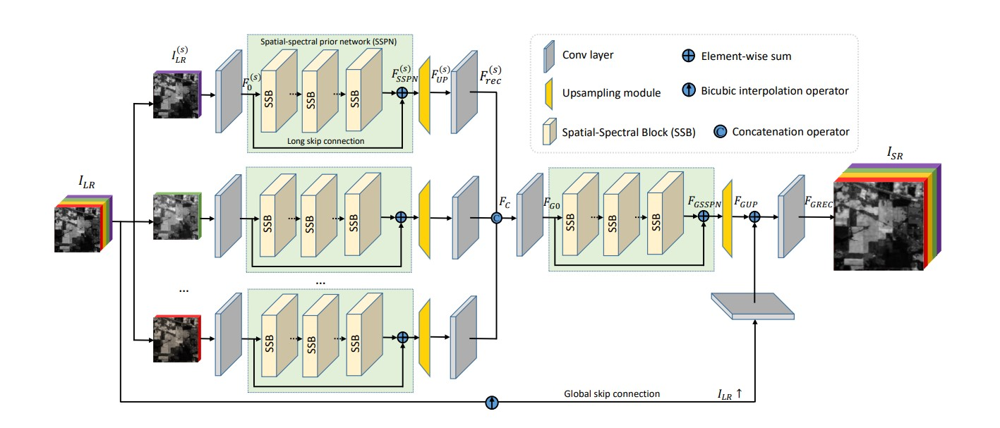

In [ ]:
Image(filename='data/modelarch.jpg')

In above figure, we show the network architecture of the proposed
SSPSR method. It mainly consists of two parts: the branch
networks and global network. For each branch network or
the global network, it includes shallow feature extraction,
spatial-spectral deep feature extraction, upsampling module,
and reconstruction part

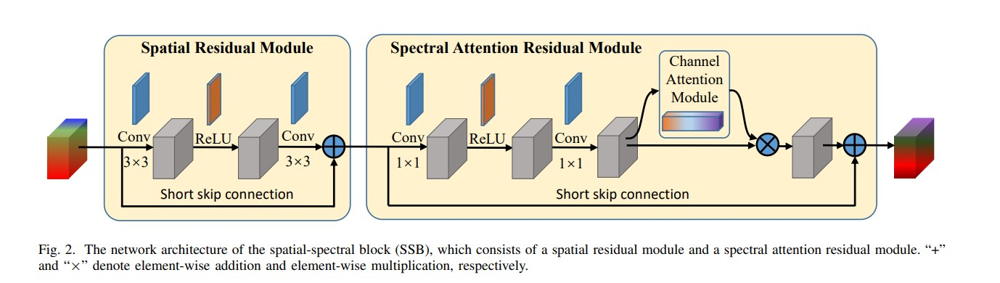

In [ ]:
Image(filename='data/ssbmodelarch.jpg')

To avoid high dim of spectral bands, we apply progressive upsampling by factor 0f 2 and also to reduce parameters, we use spectral grouping and parameter sharing across all branch of each groups. To exploit spatial-spectral features, we use effecient residual learning and attention mechanism.

Loss: The L1 loss, while effective for spatial preservation, can distort spectral information due to the absence of spectral correlations. To address this, we introduce the spatial-spectral total variation (SSTV), ensuring simultaneous spatial and spectral fidelity preservation. The final objective loss combines both losses with a weighted parameter α (set to 1e − 3 in experiments), resulting in improved reconstruction quality.

Implementation: In our implementation of the SSPSR network, we utilize the PyTorch libraries for training. We train multiple models to superresolve hyperspectral images at scale factors of 4 and 8, initializing them randomly. We employ the ADAM optimizer with an initial learning rate of 1e-4, which decreases by a factor of 10 after 30 epochs. Stability is typically achieved after 40 epochs. Training is performed using a batch size of 32.

Evaluation measures: Six widely used quantitative picture quality indices (PQIs) are employed to evaluate the performance of our method, including cross correlation (CC), spectral angle mapper (SAM), root mean squared
error (RMSE), erreur relative globale adimensionnelle de
synthese (ERGAS), peak signal-to-noise ratio (PSNR),
and structure similarity (SSIM)

# Model architecture

| Layer (Type)               | Output Shape        | Param #    | Tr. Param # |
|----------------------------|---------------------|------------|-------------|
| **Branch**                 |                     |            |             |
| Conv2d                     | [256, 256, 3, 3]    | 18,432     | 18,432      |
| **SSPN**                   |                     |            |             |
| **SSB*3**                  |                     |            |             |
| ResBlock                   |                     |            |             |
| Conv2d                     | [256, 256, 3, 3]    | 589,824    | 589,824     |
| ReLU                       | [256, 256, 3, 3]    | 0          | 0           |
| Conv2d                     | [256, 256, 3, 3]    | 589,824    | 589,824     |
| ResAttentionBlock          |                     |            |             |
| Conv2d                     | [256, 256, 1, 1]    | 65,536     | 65,536      |
| ReLU                       | [256, 256, 1, 1]    | 0          | 0           |
| Conv2d                     | [256, 256, 1, 1]    | 65,536     | 65,536      |
| CALayer:                   |                     |            |             |
| AdaptiveAvgPool2d          | [256, 256, 1, 1]    | 0          | 0           |
| Conv2d                     | [256, 16, 1, 1]     | 4,096      | 4,096       |
| ReLU                       | [256, 16, 1, 1]     | 0          | 0           |
| Conv2d                     | [256, 256, 1, 1]    | 4,352      | 4,352       |
| Sigmoid                    | [256, 256, 1, 1]    | 0          | 0           |
|**FinalSSB**                |                     |            |             |
| Upsampler                  |                     |            |             |
| Conv2d                     | [1024, 256, 3, 3]   | 2,359,296  | 2,359,296   |
| PixelShuffle               | [256, 256, 6, 6]    | 0          | 0           |
| Conv2d                     | [256, 8, 3, 3]      | 18,432     | 18,432      |
| **Trunk**                  |                     |            |             |
| Conv2d                     | [256, 256, 3, 3]    | 36,864     | 36,864      |
| **SSPN**                   |                     |            |             |
| **SSB*3**                  |                     |            |             |
| ResBlock                   |                     |            |             |
| Conv2d                     | [256, 256, 3, 3]    | 589,824    | 589,824     |
| ReLU                       | [256, 256, 3, 3]    | 0          | 0           |
| Conv2d                     | [256, 256, 3, 3]    | 589,824    | 589,824     |
| ResAttentionBlock          |                     |            |             |
| Conv2d                     | [256, 256, 1, 1]    | 65,536     | 65,536      |
| ReLU                       | [256, 256, 1, 1]    | 0          | 0           |
| Conv2d                     | [256, 256, 1, 1]    | 65,536     | 65,536      |
| CALayer:                   |                     |            |             |
| AdaptiveAvgPool2d          | [256, 256, 1, 1]    | 0          | 0           |
| Conv2d                     | [256, 16, 1, 1]     | 4,096      | 4,096       |
| ReLU                       | [256, 16, 1, 1]     | 0          | 0           |
| Conv2d                     | [256, 256, 1, 1]    | 4,352      | 4,352       |
| Sigmoid                    | [256, 256, 1, 1]    | 0          | 0           |
|**FinalSSB**                |                     |            |             |
| Upsampler                  |                     |            |             |
| Conv2d                     | [1024, 256, 3, 3]   | 2,359,296  | 2,359,296   |
| PixelShuffle               | [256, 256, 6, 6]    | 0          | 0           |
| Conv2d                     | [256, 8, 3, 3]      | 18,432     | 18,432      |
| **Skip Conv**              |                     |            |             |
| Conv2d                     | [256, 256, 3, 3]    | 294,912    | 294,912     |
| **Final**                  |                     |            |             |
| Conv2d                     | [128, 256, 3, 3]    | 295,040    | 295,040     |
| **Total Params**           |                     |            | 8,632,576   |
| **Trainable Params**       |                     |            | 8,632,576   |

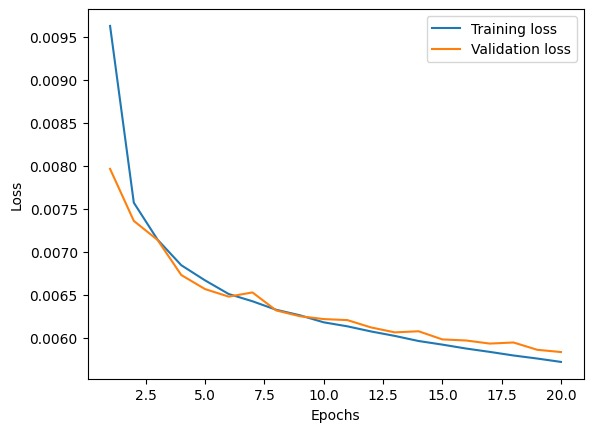

In [ ]:
# For entire dataset
!python mains.py train --dataset_name 'Chikusei' --n_blocks 3 --epochs 40 --batch_size 32 --n_subs 8 --n_ovls 2 --n_feats 256 --n_scale 4 --gpus "0,1"

{"SAM": 2.377178166794856, "MPSNR": 40.33418874985318, "RMSE": 0.011450213788333006, "MSSIM": 0.943587293133954, "CrossCorrelation": 0.9564283192157745, "ERGAS": 4.956329521921314}

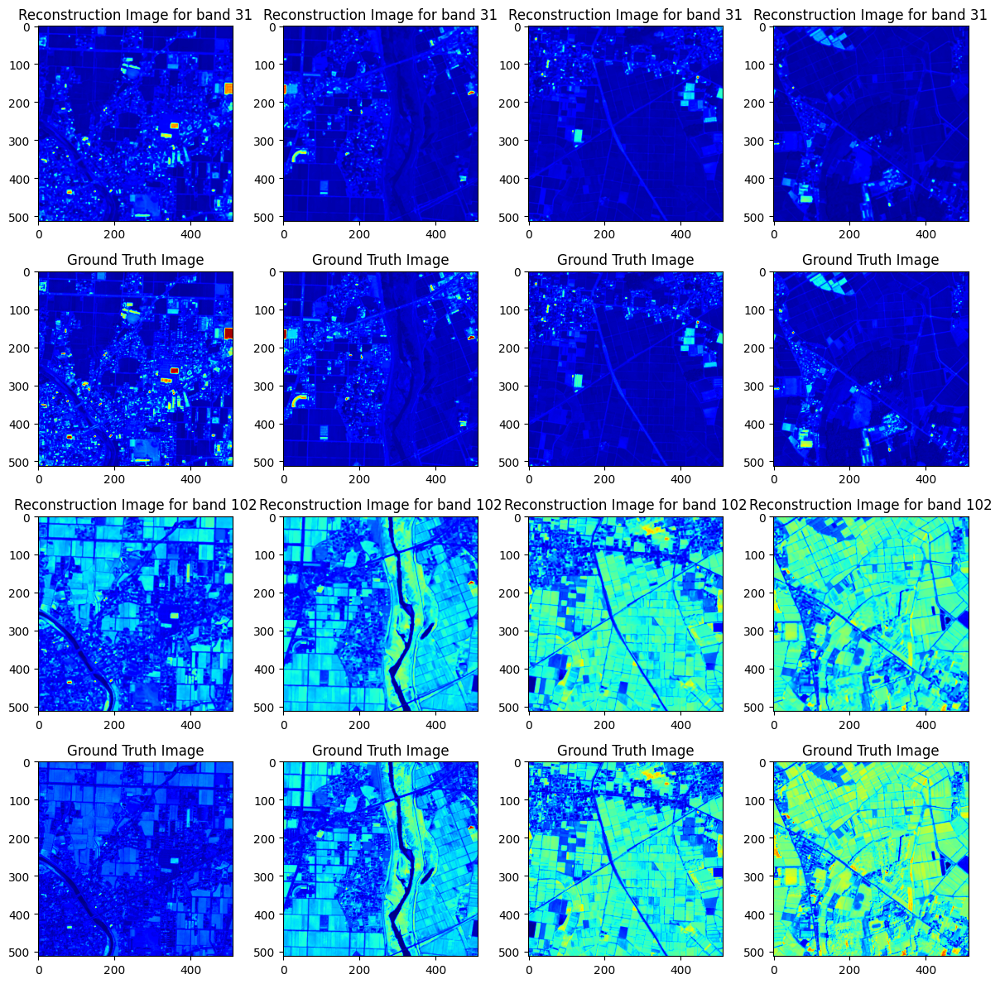

In [ ]:
import numpy as np
y = np.load('Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256_full.npy')
import scipy.io
# mat_file_path = 'dataset/Chikusei_x4/trains/train/block_Chikusei_train_1.mat'
mat_file_path = 'dataset/Chikusei_x4/Chikusei_test.mat'
mat_data = scipy.io.loadmat(mat_file_path)
image_data_ms = mat_data['ms']
image_data_msb = mat_data['ms_bicubic']
image_data_gt = mat_data['gt']
import matplotlib.pyplot as plt
import numpy as np

q = np.random.randint(0,60)
k = np.random.randint(60,128)
# Create a figure and add four subplots
fig, axs = plt.subplots(4, 4, figsize=(12, 12))
for i in range(4):
  axs[0,i].imshow(y[i,:,:,q], cmap='jet')
  axs[0,i].set_title('Reconstruction Image for band '+str(q))
  axs[1,i].imshow(image_data_gt[i,:,:,q], cmap='jet')
  axs[1,i].set_title('Ground Truth Image')
  axs[2,i].imshow(y[i,:,:,k], cmap='jet')
  axs[2,i].set_title('Reconstruction Image for band '+str(k))
  axs[3,i].imshow(image_data_gt[i,:,:,k], cmap='jet')
  axs[3,i].set_title('Ground Truth Image')

# Adjust spacing between subplots
plt.tight_layout()

# Show the figure
plt.show()

# Subset Data

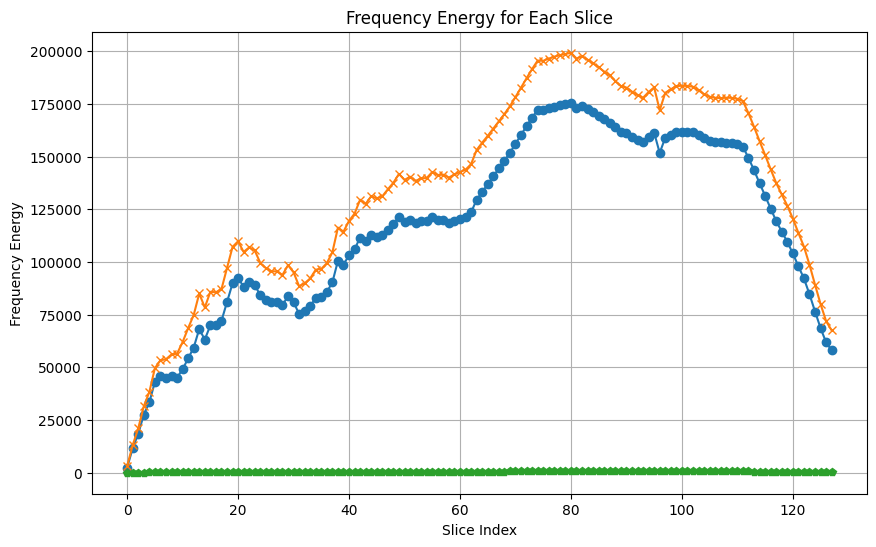

In [ ]:
import numpy as np
from scipy.fft import fft2, fftshift

# image_data = mat_data['ms_bicubic']
frequency_energy = []
# Loop through all 128 slices and compute frequency energy
for slice_index in range(128):
    fft_result = fftshift(fft2(image_data_msb[:, :, slice_index]))
    energy = np.abs(fft_result)**2
    total_energy = np.sum(energy)
    frequency_energy.append(total_energy)

# image_data_gt = mat_data['gt']
frequency_energy_gt = []
# Loop through all 128 slices and compute frequency energy
for slice_index in range(128):
    fft_result = fftshift(fft2(image_data_gt[:, :, slice_index]))
    energy = np.abs(fft_result)**2
    total_energy = np.sum(energy)
    frequency_energy_gt.append(total_energy)

# image_data_ms = mat_data['ms']
frequency_energy_ms = []
# Loop through all 128 slices and compute frequency energy
for slice_index in range(128):
    fft_result = fftshift(fft2(image_data_ms[:, :, slice_index]))
    energy = np.abs(fft_result)**2
    total_energy = np.sum(energy)
    frequency_energy_ms.append(total_energy)


import matplotlib.pyplot as plt

# Plot the frequency energy for each slice
plt.figure(figsize=(10, 6))
plt.plot(range(128), frequency_energy, label='ms_bicubic', marker='o', linestyle='-')
plt.plot(range(128), frequency_energy_gt, label='gt', marker='x', linestyle='-')
plt.plot(range(128), frequency_energy_ms, label='ms', marker='p', linestyle='-')
plt.xlabel('Slice Index')
plt.ylabel('Frequency Energy')
plt.title('Frequency Energy for Each Slice')
plt.grid(True)
plt.show()

The discrepancy in high-frequency information between GT and MS_Bicubic is because MS_Bicubic is generated through interpolation from a lower-resolution image, while GT represents the true high-resolution spectral information.

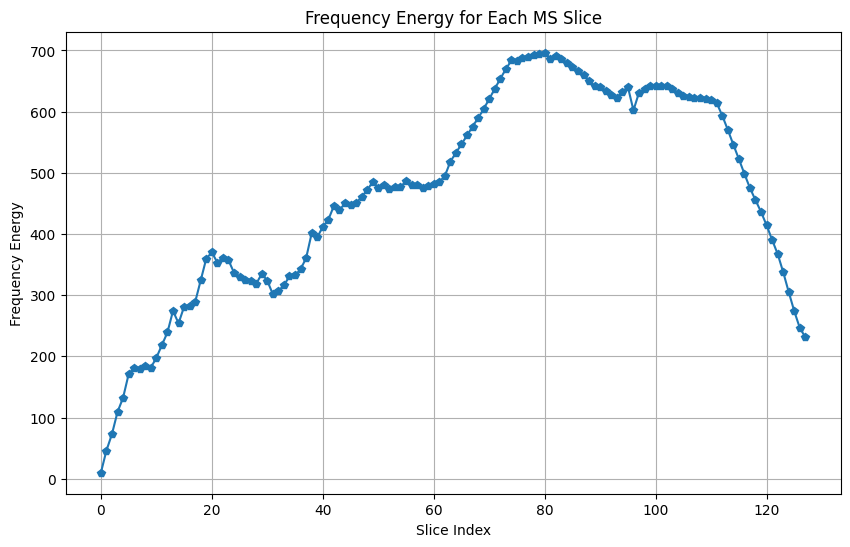

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(range(128), frequency_energy_ms, label='ms', marker='p', linestyle='-')
plt.xlabel('Slice Index')
plt.ylabel('Frequency Energy')
plt.title('Frequency Energy for Each MS Slice')
plt.grid(True)
plt.show()

In [ ]:
import os
import scipy.io
import numpy as np
import torch

# Directory containing the MATLAB files
directory_path = "dataset/Chikusei_x4/trains/train/"
files = [f for f in os.listdir(directory_path) if os.path.isfile(os.path.join(directory_path, f))]
# Define a custom sorting key function
def get_number_from_filename(filename):
    # Extract the numeric part from the file name
    numeric_part = ''.join(filter(str.isdigit, filename))
    return int(numeric_part) if numeric_part else 0
# Sort the files based on the appended numbers within their names
sorted_files = sorted(files, key=get_number_from_filename)

# Initialize lists to store spectral band statistics
spectral_band_means = []
spectral_band_maxs = []
spectral_band_stds = []
psnr = []

# Number of spectral bands (128 in your case)
num_spectral_bands = 128

# Use GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Loop through all files in the directory
for filename in sorted_files:
    if filename.endswith('.mat'):
        # Load the MATLAB file and extract data
        mat = scipy.io.loadmat(os.path.join(directory_path, filename))

        # Assuming your data is stored in a variable named 'data' in the MATLAB file
        data = mat['ms_bicubic']

        # Convert data to a PyTorch tensor and move it to the GPU
        data_tensor = torch.tensor(data, dtype=torch.float32, device=device)

        # Initialize tensors to store band statistics
        band_means = torch.zeros(num_spectral_bands, device=device)
        band_maxs = torch.zeros(num_spectral_bands, device=device)
        band_stds = torch.zeros(num_spectral_bands, device=device)

        # Iterate through spectral bands and calculate statistics
        for band_index in range(num_spectral_bands):
            spectral_band_data = data_tensor[:, :, band_index]
            band_means[band_index] = torch.mean(spectral_band_data)
            band_maxs[band_index] = torch.max(spectral_band_data)
            band_stds[band_index] = torch.std(spectral_band_data)

        psnr.append(peak_signal_noise_ratio(mat['gt'], data))

        # Append spectral band statistics to the respective lists
        spectral_band_means.append(band_means.cpu().numpy())  # Move data back to CPU
        spectral_band_maxs.append(band_maxs.cpu().numpy())  # Move data back to CPU
        spectral_band_stds.append(band_stds.cpu().numpy())  # Move data back to CPU

# Calculate overall statistics (e.g., mean and max across all spectral bands)
overall_mean = np.mean(spectral_band_means, axis=0)
overall_std = np.mean(spectral_band_stds, axis=0)
overall_max = np.max(spectral_band_maxs, axis=0)
overall_psnr = np.mean(psnr, axis=0)

# Print the overall spectral band statistics
# print(f'Overall Mean Values across Spectral Bands: {overall_mean}')
# print(f'Overall STD Values across Spectral Bands: {overall_std}')
# print(f'Overall Max Values across Spectral Bands: {overall_max}')

In [ ]:
file_path = 'spectral_band_mean.txt'
with open(file_path, 'w') as file:
    for arr in spectral_band_means:
        line = np.array2string(arr, separator=', ')
        file.write(line + '\n')
file.close()
print(f'Spectral band means saved to {file_path}')
file_path = 'spectral_band_max.txt'
with open(file_path, 'w') as file:
    for arr in spectral_band_maxs:
        line = np.array2string(arr, separator=', ')
        file.write(line + '\n')
file.close()
print(f'Spectral band Maxs saved to {file_path}')
file_path = 'spectral_band_std.txt'
with open(file_path, 'w') as file:
    for arr in spectral_band_stds:
        line = np.array2string(arr, separator=', ')
        file.write(line + '\n')
file.close()
print(f'Spectral band Maxs saved to {file_path}')
file_path = 'spectral_band_psnr.txt'
with open(file_path, 'w') as file:
    for arr in psnr:
        line = np.array2string(arr, separator=', ')
        file.write(line + '\n')
file.close()
print(f'Spectral band Maxs saved to {file_path}')

Spectral band means saved to spectral_band_mean.txt
Spectral band Maxs saved to spectral_band_max.txt
Spectral band Maxs saved to spectral_band_std.txt
Spectral band Maxs saved to spectral_band_psnr.txt


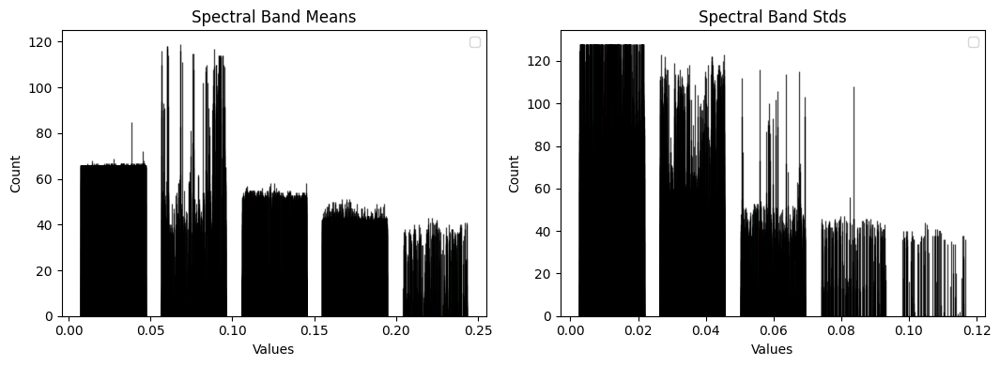

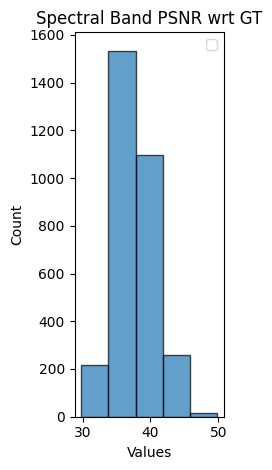

In [ ]:
# Create a subplot with two plots side by side
plt.figure(figsize=(16, 4))  # Adjust the figure size as needed

# Subplot 1: Left plot
plt.subplot(1, 3, 1)  # (rows, columns, subplot number)
plt.hist(spectral_band_means, bins=5, edgecolor='black', alpha=0.7)
plt.title('Spectral Band Means')
plt.xlabel('Values')
plt.ylabel('Count')
plt.legend()

# Subplot 2: Middle plot
plt.subplot(1, 3, 2)  # (rows, columns, subplot number)
plt.hist(spectral_band_stds, bins=5, edgecolor='black', alpha=0.7)
plt.title('Spectral Band Stds')
plt.xlabel('Values')
plt.ylabel('Count')
plt.legend()
plt.tight_layout()  # Ensures that the plots don't overlap
plt.show()

# Subplot 3: Right plot
plt.subplot(1, 3, 3)  # (rows, columns, subplot number)
plt.hist(psnr, bins=5, edgecolor='black', alpha=0.7)
plt.title('Spectral Band PSNR wrt GT')
plt.xlabel('Values')
plt.ylabel('Count')
plt.legend()
plt.tight_layout()  # Ensures that the plots don't overlap
plt.show()

Hypothesis: Prioritizing values exceeding 0.1 in superresolution aims to enhance spatial resolution within brighter regions of the hyperspectral data, as these regions are considered to have more pronounced features.

A normalized value greater than 0.1 in a spectral band signifies that the band holds substantial, distinctive spectral information within the single hyperspectral image. These influential bands are crucial for enhancing spatial and spectral details during superresolution, as they contain valuable signal content that contributes to the higher-resolution output.

In [ ]:
overall_mean_spectral = np.mean(spectral_band_means, axis=1)
high_indices = np.where(overall_mean_spectral > 0.09)[0]
low_indices = np.where(overall_mean_spectral < 0.09)[0]
print(len(high_indices))
print(len(low_indices))

636
2482


In [ ]:
threshold = 50
indices = [index for index, value in enumerate(psnr) if value > 40]
count = len(indices)
print("Count:", count)

Count: 663


In [ ]:
import numpy as np
import os
import copy
import shutil

# Source and destination directories
source_dir = "dataset/Chikusei_x4/trains/train/"
destination_dir = "dataset/Chikusei_x4/trains_sub_psnr/train/"

# Ensure the destination directory exists; create it if not
os.makedirs(destination_dir, exist_ok=True)

# Copy files corresponding to the selected indices
for idx in indices:
    if idx < len(sorted_files):
        file_name = sorted_files[idx]
        source_path = os.path.join(source_dir, file_name)
        destination_path = os.path.join(destination_dir, file_name)
        shutil.copy(source_path, destination_path)
        # print(f"File '{file_name}' copied from source to destination.")
    else:
        print(f"Index {idx} is out of range. Skipping.")

In [ ]:
import numpy as np
import os
import copy
import shutil

# Source and destination directories
source_dir = "dataset/Chikusei_x4/trains/train/"
destination_dir = "dataset/Chikusei_x4/trains_sub/train/"

# Ensure the destination directory exists; create it if not
os.makedirs(destination_dir, exist_ok=True)

# Copy files corresponding to the selected indices
for idx in indices:
    if idx < len(sorted_files):
        file_name = sorted_files[idx]
        source_path = os.path.join(source_dir, file_name)
        destination_path = os.path.join(destination_dir, file_name)
        shutil.copy(source_path, destination_path)
        # print(f"File '{file_name}' copied from source to destination.")
    else:
        print(f"Index {idx} is out of range. Skipping.")

In [ ]:
!python mains.py train --dataset_name 'Chikusei' --n_blocks 3 --epochs 40 --batch_size 32 --n_subs 8 --n_ovls 2 --n_feats 256 --n_scale 4 --gpus "0,1"
# subset 8, overlap b/w neighbouring groups - 2 - each group contains 8 spectral bands, and there are 2 bands that are shared or overlapping with the neighboring group.

0,1
Start seed:  3000
===> Loading datasets
./dataset/Chikusei_x4/trains_sub/
./dataset/Chikusei_x4/trains_sub/
./dataset/Chikusei_x4/trains_sub/train
['block_Chikusei_train_313.mat', 'block_Chikusei_train_3136.mat', 'block_Chikusei_train_3137.mat', 'block_Chikusei_train_3138.mat', 'block_Chikusei_train_3156.mat', 'block_Chikusei_train_3157.mat', 'block_Chikusei_train_3158.mat', 'block_Chikusei_train_3159.mat', 'block_Chikusei_train_3162.mat', 'block_Chikusei_train_3165.mat', 'block_Chikusei_train_3216.mat', 'block_Chikusei_train_3217.mat', 'block_Chikusei_train_3218.mat', 'block_Chikusei_train_3220.mat', 'block_Chikusei_train_3221.mat', 'block_Chikusei_train_3225.mat', 'block_Chikusei_train_3228.mat', 'block_Chikusei_train_3229.mat', 'block_Chikusei_train_3230.mat', 'block_Chikusei_train_3231.mat', 'block_Chikusei_train_3257.mat', 'block_Chikusei_train_3263.mat', 'block_Chikusei_train_3273.mat', 'block_Chikusei_train_3278.mat', 'block_Chikusei_train_3279.mat', 'block_Chikusei_train_32

Test finished, test results saved to .npy file at  Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256.npy
{'MPSNR': 37.03723373200209, 'MSSIM': 0.9026191979646683, 'CrossCorrelation': 0.9085787683725357, 'ERGAS': 7.597001727048109, 'RMSE': 0.016034727356937884, 'SAM': 4.658053570213432}

{'MSSIM': 0.9362233430147171, 'MPSNR': 39.64767675449352, 'ERGAS': 5.3931825476979345, 'RMSE': 0.012329154539255191, 'SAM': 2.6400506917454742, 'CrossCorrelation': 0.9491391330957413} - 40 epochs, subset

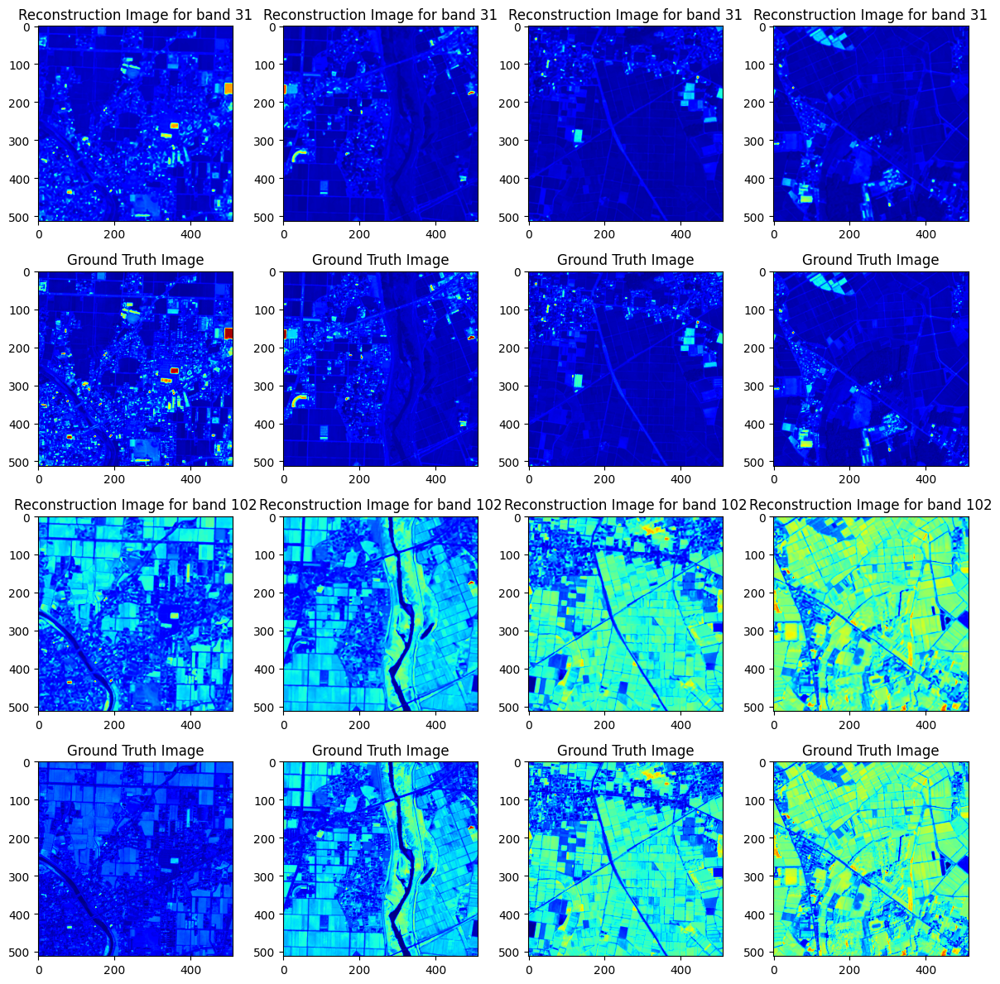

In [ ]:
import numpy as np
y = np.load('Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256.npy')
import scipy.io
# mat_file_path = 'dataset/Chikusei_x4/trains/train/block_Chikusei_train_1.mat'
mat_file_path = 'dataset/Chikusei_x4/Chikusei_test.mat'
mat_data = scipy.io.loadmat(mat_file_path)
image_data_ms = mat_data['ms']
image_data_msb = mat_data['ms_bicubic']
image_data_gt = mat_data['gt']
import matplotlib.pyplot as plt
import numpy as np

q = np.random.randint(0,60)
k = np.random.randint(60,128)
# Create a figure and add four subplots
fig, axs = plt.subplots(4, 4, figsize=(12, 12))
for i in range(4):
  axs[0,i].imshow(y[i,:,:,q], cmap='jet')
  axs[0,i].set_title('Reconstruction Image for band '+str(q))
  axs[1,i].imshow(image_data_gt[i,:,:,q], cmap='jet')
  axs[1,i].set_title('Ground Truth Image')
  axs[2,i].imshow(y[i,:,:,k], cmap='jet')
  axs[2,i].set_title('Reconstruction Image for band '+str(k))
  axs[3,i].imshow(image_data_gt[i,:,:,k], cmap='jet')
  axs[3,i].set_title('Ground Truth Image')

# Adjust spacing between subplots
plt.tight_layout()

# Show the figure
plt.show()

Training Losses: [0.015034, 0.008985, 0.00832, 0.008015, 0.007774, 0.007563, 0.00744, 0.007289, 0.007208, 0.007104, 0.007021, 0.006936, 0.006874, 0.006764, 0.006702, 0.006623, 0.006578, 0.006495, 0.006446, 0.006446, 0.006374, 0.006379, 0.006258, 0.006235, 0.006193, 0.006142, 0.006132, 0.006114, 0.00606, 0.005925, 0.005913, 0.005908, 0.005904, 0.0059, 0.005896, 0.005891, 0.005888, 0.005883, 0.00588, 0.005875]
Validation Losses: [0.01029, 0.008746, 0.008375, 0.008274, 0.007864, 0.0077, 0.007605, 0.007668, 0.007486, 0.007323, 0.007249, 0.007199, 0.007124, 0.007081, 0.007013, 0.006957, 0.006912, 0.006868, 0.006896, 0.006837, 0.006982, 0.006774, 0.006726, 0.006692, 0.006653, 0.006649, 0.006628, 0.006641, 0.006588, 0.00651, 0.00651, 0.00651, 0.006506, 0.006502, 0.006502, 0.006497, 0.006497, 0.006496, 0.006493, 0.006492]


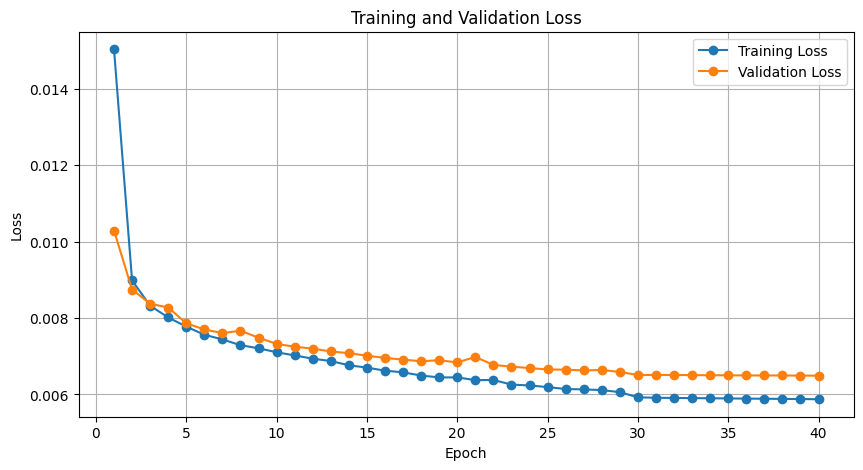

In [ ]:
import re

log = """
===> Building model
===> Setting optimizer and logger
===> Start training
Start epoch 1, learning rate = 0.0001
===> Tue Sep 26 16:38:10 2023 B3 Sub8 Fea256 GPU0,1	Epoch[1](1/159): Loss: 0.111454
===> Tue Sep 26 16:39:10 2023 B3 Sub8 Fea256 GPU0,1	Epoch[1](51/159): Loss: 0.012165
===> Tue Sep 26 16:40:14 2023 B3 Sub8 Fea256 GPU0,1	Epoch[1](101/159): Loss: 0.011097
===> Tue Sep 26 16:41:18 2023 B3 Sub8 Fea256 GPU0,1	Epoch[1](151/159): Loss: 0.009076
===> Tue Sep 26 16:41:28 2023	Epoch 1 Training Complete: Avg. Loss: 0.015034
===> Tue Sep 26 16:42:10 2023	Epoch evaluation Complete: Avg. Loss: 0.010290
Start epoch 2, learning rate = 0.0001
===> Tue Sep 26 16:42:18 2023 B3 Sub8 Fea256 GPU0,1	Epoch[2](1/159): Loss: 0.010438
===> Tue Sep 26 16:43:24 2023 B3 Sub8 Fea256 GPU0,1	Epoch[2](51/159): Loss: 0.008507
===> Tue Sep 26 16:44:28 2023 B3 Sub8 Fea256 GPU0,1	Epoch[2](101/159): Loss: 0.008948
===> Tue Sep 26 16:45:32 2023 B3 Sub8 Fea256 GPU0,1	Epoch[2](151/159): Loss: 0.008202
===> Tue Sep 26 16:45:42 2023	Epoch 2 Training Complete: Avg. Loss: 0.008985
===> Tue Sep 26 16:45:54 2023	Epoch evaluation Complete: Avg. Loss: 0.008746
Start epoch 3, learning rate = 0.0001
===> Tue Sep 26 16:46:00 2023 B3 Sub8 Fea256 GPU0,1	Epoch[3](1/159): Loss: 0.007888
===> Tue Sep 26 16:47:06 2023 B3 Sub8 Fea256 GPU0,1	Epoch[3](51/159): Loss: 0.008040
===> Tue Sep 26 16:48:10 2023 B3 Sub8 Fea256 GPU0,1	Epoch[3](101/159): Loss: 0.008553
===> Tue Sep 26 16:49:13 2023 B3 Sub8 Fea256 GPU0,1	Epoch[3](151/159): Loss: 0.008057
===> Tue Sep 26 16:49:24 2023	Epoch 3 Training Complete: Avg. Loss: 0.008320
===> Tue Sep 26 16:49:36 2023	Epoch evaluation Complete: Avg. Loss: 0.008375
Start epoch 4, learning rate = 0.0001
===> Tue Sep 26 16:49:43 2023 B3 Sub8 Fea256 GPU0,1	Epoch[4](1/159): Loss: 0.007584
===> Tue Sep 26 16:50:49 2023 B3 Sub8 Fea256 GPU0,1	Epoch[4](51/159): Loss: 0.008285
===> Tue Sep 26 16:51:53 2023 B3 Sub8 Fea256 GPU0,1	Epoch[4](101/159): Loss: 0.008216
===> Tue Sep 26 16:52:57 2023 B3 Sub8 Fea256 GPU0,1	Epoch[4](151/159): Loss: 0.007607
===> Tue Sep 26 16:53:07 2023	Epoch 4 Training Complete: Avg. Loss: 0.008015
===> Tue Sep 26 16:53:19 2023	Epoch evaluation Complete: Avg. Loss: 0.008274
Start epoch 5, learning rate = 0.0001
===> Tue Sep 26 16:53:25 2023 B3 Sub8 Fea256 GPU0,1	Epoch[5](1/159): Loss: 0.008794
===> Tue Sep 26 16:54:32 2023 B3 Sub8 Fea256 GPU0,1	Epoch[5](51/159): Loss: 0.007576
===> Tue Sep 26 16:55:35 2023 B3 Sub8 Fea256 GPU0,1	Epoch[5](101/159): Loss: 0.007945
===> Tue Sep 26 16:56:39 2023 B3 Sub8 Fea256 GPU0,1	Epoch[5](151/159): Loss: 0.007355
===> Tue Sep 26 16:56:49 2023	Epoch 5 Training Complete: Avg. Loss: 0.007774
===> Tue Sep 26 16:57:01 2023	Epoch evaluation Complete: Avg. Loss: 0.007864
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256_ckpt_epoch_5.pth
Start epoch 6, learning rate = 0.0001
===> Tue Sep 26 16:57:09 2023 B3 Sub8 Fea256 GPU0,1	Epoch[6](1/159): Loss: 0.007325
===> Tue Sep 26 16:58:15 2023 B3 Sub8 Fea256 GPU0,1	Epoch[6](51/159): Loss: 0.007633
===> Tue Sep 26 16:59:18 2023 B3 Sub8 Fea256 GPU0,1	Epoch[6](101/159): Loss: 0.007357
===> Tue Sep 26 17:00:22 2023 B3 Sub8 Fea256 GPU0,1	Epoch[6](151/159): Loss: 0.007335
===> Tue Sep 26 17:00:32 2023	Epoch 6 Training Complete: Avg. Loss: 0.007563
===> Tue Sep 26 17:00:45 2023	Epoch evaluation Complete: Avg. Loss: 0.007700
Start epoch 7, learning rate = 0.0001
===> Tue Sep 26 17:00:53 2023 B3 Sub8 Fea256 GPU0,1	Epoch[7](1/159): Loss: 0.008223
===> Tue Sep 26 17:01:59 2023 B3 Sub8 Fea256 GPU0,1	Epoch[7](51/159): Loss: 0.007677
===> Tue Sep 26 17:03:03 2023 B3 Sub8 Fea256 GPU0,1	Epoch[7](101/159): Loss: 0.007386
===> Tue Sep 26 17:04:07 2023 B3 Sub8 Fea256 GPU0,1	Epoch[7](151/159): Loss: 0.007421
===> Tue Sep 26 17:04:17 2023	Epoch 7 Training Complete: Avg. Loss: 0.007440
===> Tue Sep 26 17:04:28 2023	Epoch evaluation Complete: Avg. Loss: 0.007605
Start epoch 8, learning rate = 0.0001
===> Tue Sep 26 17:04:36 2023 B3 Sub8 Fea256 GPU0,1	Epoch[8](1/159): Loss: 0.006870
===> Tue Sep 26 17:05:42 2023 B3 Sub8 Fea256 GPU0,1	Epoch[8](51/159): Loss: 0.007499
===> Tue Sep 26 17:06:46 2023 B3 Sub8 Fea256 GPU0,1	Epoch[8](101/159): Loss: 0.006707
===> Tue Sep 26 17:07:49 2023 B3 Sub8 Fea256 GPU0,1	Epoch[8](151/159): Loss: 0.007120
===> Tue Sep 26 17:08:00 2023	Epoch 8 Training Complete: Avg. Loss: 0.007289
===> Tue Sep 26 17:08:12 2023	Epoch evaluation Complete: Avg. Loss: 0.007668
Start epoch 9, learning rate = 0.0001
===> Tue Sep 26 17:08:19 2023 B3 Sub8 Fea256 GPU0,1	Epoch[9](1/159): Loss: 0.008057
===> Tue Sep 26 17:09:26 2023 B3 Sub8 Fea256 GPU0,1	Epoch[9](51/159): Loss: 0.007469
===> Tue Sep 26 17:10:30 2023 B3 Sub8 Fea256 GPU0,1	Epoch[9](101/159): Loss: 0.007360
===> Tue Sep 26 17:11:33 2023 B3 Sub8 Fea256 GPU0,1	Epoch[9](151/159): Loss: 0.006996
===> Tue Sep 26 17:11:43 2023	Epoch 9 Training Complete: Avg. Loss: 0.007208
===> Tue Sep 26 17:11:55 2023	Epoch evaluation Complete: Avg. Loss: 0.007486
Start epoch 10, learning rate = 0.0001
===> Tue Sep 26 17:12:04 2023 B3 Sub8 Fea256 GPU0,1	Epoch[10](1/159): Loss: 0.007293
===> Tue Sep 26 17:13:09 2023 B3 Sub8 Fea256 GPU0,1	Epoch[10](51/159): Loss: 0.007290
===> Tue Sep 26 17:14:13 2023 B3 Sub8 Fea256 GPU0,1	Epoch[10](101/159): Loss: 0.007314
===> Tue Sep 26 17:15:16 2023 B3 Sub8 Fea256 GPU0,1	Epoch[10](151/159): Loss: 0.007059
===> Tue Sep 26 17:15:27 2023	Epoch 10 Training Complete: Avg. Loss: 0.007104
===> Tue Sep 26 17:15:39 2023	Epoch evaluation Complete: Avg. Loss: 0.007323
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256_ckpt_epoch_10.pth
Start epoch 11, learning rate = 0.0001
===> Tue Sep 26 17:15:47 2023 B3 Sub8 Fea256 GPU0,1	Epoch[11](1/159): Loss: 0.006808
===> Tue Sep 26 17:16:51 2023 B3 Sub8 Fea256 GPU0,1	Epoch[11](51/159): Loss: 0.007161
===> Tue Sep 26 17:17:54 2023 B3 Sub8 Fea256 GPU0,1	Epoch[11](101/159): Loss: 0.007411
===> Tue Sep 26 17:18:57 2023 B3 Sub8 Fea256 GPU0,1	Epoch[11](151/159): Loss: 0.006774
===> Tue Sep 26 17:19:07 2023	Epoch 11 Training Complete: Avg. Loss: 0.007021
===> Tue Sep 26 17:19:19 2023	Epoch evaluation Complete: Avg. Loss: 0.007249
Start epoch 12, learning rate = 0.0001
===> Tue Sep 26 17:19:26 2023 B3 Sub8 Fea256 GPU0,1	Epoch[12](1/159): Loss: 0.006407
===> Tue Sep 26 17:20:30 2023 B3 Sub8 Fea256 GPU0,1	Epoch[12](51/159): Loss: 0.006742
===> Tue Sep 26 17:21:33 2023 B3 Sub8 Fea256 GPU0,1	Epoch[12](101/159): Loss: 0.007517
===> Tue Sep 26 17:22:36 2023 B3 Sub8 Fea256 GPU0,1	Epoch[12](151/159): Loss: 0.006761
===> Tue Sep 26 17:22:46 2023	Epoch 12 Training Complete: Avg. Loss: 0.006936
===> Tue Sep 26 17:22:58 2023	Epoch evaluation Complete: Avg. Loss: 0.007199
Start epoch 13, learning rate = 0.0001
===> Tue Sep 26 17:23:05 2023 B3 Sub8 Fea256 GPU0,1	Epoch[13](1/159): Loss: 0.006829
===> Tue Sep 26 17:24:09 2023 B3 Sub8 Fea256 GPU0,1	Epoch[13](51/159): Loss: 0.006568
===> Tue Sep 26 17:25:12 2023 B3 Sub8 Fea256 GPU0,1	Epoch[13](101/159): Loss: 0.006462
===> Tue Sep 26 17:26:15 2023 B3 Sub8 Fea256 GPU0,1	Epoch[13](151/159): Loss: 0.006487
===> Tue Sep 26 17:26:25 2023	Epoch 13 Training Complete: Avg. Loss: 0.006874
===> Tue Sep 26 17:26:38 2023	Epoch evaluation Complete: Avg. Loss: 0.007124
Start epoch 14, learning rate = 0.0001
===> Tue Sep 26 17:26:45 2023 B3 Sub8 Fea256 GPU0,1	Epoch[14](1/159): Loss: 0.006561
===> Tue Sep 26 17:27:49 2023 B3 Sub8 Fea256 GPU0,1	Epoch[14](51/159): Loss: 0.006326
===> Tue Sep 26 17:28:52 2023 B3 Sub8 Fea256 GPU0,1	Epoch[14](101/159): Loss: 0.007098
===> Tue Sep 26 17:29:54 2023 B3 Sub8 Fea256 GPU0,1	Epoch[14](151/159): Loss: 0.007587
===> Tue Sep 26 17:30:04 2023	Epoch 14 Training Complete: Avg. Loss: 0.006764
===> Tue Sep 26 17:30:17 2023	Epoch evaluation Complete: Avg. Loss: 0.007081
Start epoch 15, learning rate = 0.0001
===> Tue Sep 26 17:30:24 2023 B3 Sub8 Fea256 GPU0,1	Epoch[15](1/159): Loss: 0.006559
===> Tue Sep 26 17:31:27 2023 B3 Sub8 Fea256 GPU0,1	Epoch[15](51/159): Loss: 0.006715
===> Tue Sep 26 17:32:30 2023 B3 Sub8 Fea256 GPU0,1	Epoch[15](101/159): Loss: 0.006236
===> Tue Sep 26 17:33:33 2023 B3 Sub8 Fea256 GPU0,1	Epoch[15](151/159): Loss: 0.006619
===> Tue Sep 26 17:33:43 2023	Epoch 15 Training Complete: Avg. Loss: 0.006702
===> Tue Sep 26 17:33:55 2023	Epoch evaluation Complete: Avg. Loss: 0.007013
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256_ckpt_epoch_15.pth
Start epoch 16, learning rate = 0.0001
===> Tue Sep 26 17:34:05 2023 B3 Sub8 Fea256 GPU0,1	Epoch[16](1/159): Loss: 0.006618
===> Tue Sep 26 17:35:08 2023 B3 Sub8 Fea256 GPU0,1	Epoch[16](51/159): Loss: 0.006537
===> Tue Sep 26 17:36:10 2023 B3 Sub8 Fea256 GPU0,1	Epoch[16](101/159): Loss: 0.007185
===> Tue Sep 26 17:37:13 2023 B3 Sub8 Fea256 GPU0,1	Epoch[16](151/159): Loss: 0.006809
===> Tue Sep 26 17:37:23 2023	Epoch 16 Training Complete: Avg. Loss: 0.006623
===> Tue Sep 26 17:37:36 2023	Epoch evaluation Complete: Avg. Loss: 0.006957
Start epoch 17, learning rate = 0.0001
===> Tue Sep 26 17:37:43 2023 B3 Sub8 Fea256 GPU0,1	Epoch[17](1/159): Loss: 0.006628
===> Tue Sep 26 17:38:47 2023 B3 Sub8 Fea256 GPU0,1	Epoch[17](51/159): Loss: 0.006896
===> Tue Sep 26 17:39:50 2023 B3 Sub8 Fea256 GPU0,1	Epoch[17](101/159): Loss: 0.006339
===> Tue Sep 26 17:40:53 2023 B3 Sub8 Fea256 GPU0,1	Epoch[17](151/159): Loss: 0.006412
===> Tue Sep 26 17:41:03 2023	Epoch 17 Training Complete: Avg. Loss: 0.006578
===> Tue Sep 26 17:41:15 2023	Epoch evaluation Complete: Avg. Loss: 0.006912
Start epoch 18, learning rate = 0.0001
===> Tue Sep 26 17:41:23 2023 B3 Sub8 Fea256 GPU0,1	Epoch[18](1/159): Loss: 0.006706
===> Tue Sep 26 17:42:27 2023 B3 Sub8 Fea256 GPU0,1	Epoch[18](51/159): Loss: 0.006704
===> Tue Sep 26 17:43:30 2023 B3 Sub8 Fea256 GPU0,1	Epoch[18](101/159): Loss: 0.006374
===> Tue Sep 26 17:44:33 2023 B3 Sub8 Fea256 GPU0,1	Epoch[18](151/159): Loss: 0.006462
===> Tue Sep 26 17:44:43 2023	Epoch 18 Training Complete: Avg. Loss: 0.006495
===> Tue Sep 26 17:44:55 2023	Epoch evaluation Complete: Avg. Loss: 0.006868
Start epoch 19, learning rate = 0.0001
===> Tue Sep 26 17:45:03 2023 B3 Sub8 Fea256 GPU0,1	Epoch[19](1/159): Loss: 0.006338
===> Tue Sep 26 17:46:07 2023 B3 Sub8 Fea256 GPU0,1	Epoch[19](51/159): Loss: 0.006864
===> Tue Sep 26 17:47:11 2023 B3 Sub8 Fea256 GPU0,1	Epoch[19](101/159): Loss: 0.005832
===> Tue Sep 26 17:48:13 2023 B3 Sub8 Fea256 GPU0,1	Epoch[19](151/159): Loss: 0.006122
===> Tue Sep 26 17:48:23 2023	Epoch 19 Training Complete: Avg. Loss: 0.006446
===> Tue Sep 26 17:48:35 2023	Epoch evaluation Complete: Avg. Loss: 0.006896
Start epoch 20, learning rate = 0.0001
===> Tue Sep 26 17:48:44 2023 B3 Sub8 Fea256 GPU0,1	Epoch[20](1/159): Loss: 0.005998
===> Tue Sep 26 17:49:48 2023 B3 Sub8 Fea256 GPU0,1	Epoch[20](51/159): Loss: 0.006565
===> Tue Sep 26 17:50:52 2023 B3 Sub8 Fea256 GPU0,1	Epoch[20](101/159): Loss: 0.006471
===> Tue Sep 26 17:51:56 2023 B3 Sub8 Fea256 GPU0,1	Epoch[20](151/159): Loss: 0.006910
===> Tue Sep 26 17:52:06 2023	Epoch 20 Training Complete: Avg. Loss: 0.006446
===> Tue Sep 26 17:52:19 2023	Epoch evaluation Complete: Avg. Loss: 0.006837
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256_ckpt_epoch_20.pth
Start epoch 21, learning rate = 0.0001
===> Tue Sep 26 17:52:28 2023 B3 Sub8 Fea256 GPU0,1	Epoch[21](1/159): Loss: 0.007018
===> Tue Sep 26 17:53:35 2023 B3 Sub8 Fea256 GPU0,1	Epoch[21](51/159): Loss: 0.005892
===> Tue Sep 26 17:54:39 2023 B3 Sub8 Fea256 GPU0,1	Epoch[21](101/159): Loss: 0.006124
===> Tue Sep 26 17:55:43 2023 B3 Sub8 Fea256 GPU0,1	Epoch[21](151/159): Loss: 0.006659
===> Tue Sep 26 17:55:54 2023	Epoch 21 Training Complete: Avg. Loss: 0.006374
===> Tue Sep 26 17:56:05 2023	Epoch evaluation Complete: Avg. Loss: 0.006982
Start epoch 22, learning rate = 0.0001
===> Tue Sep 26 17:56:14 2023 B3 Sub8 Fea256 GPU0,1	Epoch[22](1/159): Loss: 0.006276
===> Tue Sep 26 17:57:21 2023 B3 Sub8 Fea256 GPU0,1	Epoch[22](51/159): Loss: 0.006012
===> Tue Sep 26 17:58:25 2023 B3 Sub8 Fea256 GPU0,1	Epoch[22](101/159): Loss: 0.006505
===> Tue Sep 26 17:59:29 2023 B3 Sub8 Fea256 GPU0,1	Epoch[22](151/159): Loss: 0.006255
===> Tue Sep 26 17:59:39 2023	Epoch 22 Training Complete: Avg. Loss: 0.006379
===> Tue Sep 26 17:59:52 2023	Epoch evaluation Complete: Avg. Loss: 0.006774
Start epoch 23, learning rate = 0.0001
===> Tue Sep 26 18:00:01 2023 B3 Sub8 Fea256 GPU0,1	Epoch[23](1/159): Loss: 0.006367
===> Tue Sep 26 18:01:08 2023 B3 Sub8 Fea256 GPU0,1	Epoch[23](51/159): Loss: 0.005987
===> Tue Sep 26 18:02:12 2023 B3 Sub8 Fea256 GPU0,1	Epoch[23](101/159): Loss: 0.006389
===> Tue Sep 26 18:03:17 2023 B3 Sub8 Fea256 GPU0,1	Epoch[23](151/159): Loss: 0.005705
===> Tue Sep 26 18:03:27 2023	Epoch 23 Training Complete: Avg. Loss: 0.006258
===> Tue Sep 26 18:03:39 2023	Epoch evaluation Complete: Avg. Loss: 0.006726
Start epoch 24, learning rate = 0.0001
===> Tue Sep 26 18:03:49 2023 B3 Sub8 Fea256 GPU0,1	Epoch[24](1/159): Loss: 0.006052
===> Tue Sep 26 18:04:56 2023 B3 Sub8 Fea256 GPU0,1	Epoch[24](51/159): Loss: 0.006348
===> Tue Sep 26 18:06:01 2023 B3 Sub8 Fea256 GPU0,1	Epoch[24](101/159): Loss: 0.005603
===> Tue Sep 26 18:07:05 2023 B3 Sub8 Fea256 GPU0,1	Epoch[24](151/159): Loss: 0.005939
===> Tue Sep 26 18:07:15 2023	Epoch 24 Training Complete: Avg. Loss: 0.006235
===> Tue Sep 26 18:07:27 2023	Epoch evaluation Complete: Avg. Loss: 0.006692
Start epoch 25, learning rate = 0.0001
===> Tue Sep 26 18:07:36 2023 B3 Sub8 Fea256 GPU0,1	Epoch[25](1/159): Loss: 0.005575
===> Tue Sep 26 18:08:40 2023 B3 Sub8 Fea256 GPU0,1	Epoch[25](51/159): Loss: 0.006589
===> Tue Sep 26 18:09:43 2023 B3 Sub8 Fea256 GPU0,1	Epoch[25](101/159): Loss: 0.005995
===> Tue Sep 26 18:10:46 2023 B3 Sub8 Fea256 GPU0,1	Epoch[25](151/159): Loss: 0.005903
===> Tue Sep 26 18:10:57 2023	Epoch 25 Training Complete: Avg. Loss: 0.006193
===> Tue Sep 26 18:11:09 2023	Epoch evaluation Complete: Avg. Loss: 0.006653
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256_ckpt_epoch_25.pth
Start epoch 26, learning rate = 0.0001
===> Tue Sep 26 18:11:17 2023 B3 Sub8 Fea256 GPU0,1	Epoch[26](1/159): Loss: 0.006087
===> Tue Sep 26 18:12:22 2023 B3 Sub8 Fea256 GPU0,1	Epoch[26](51/159): Loss: 0.006057
===> Tue Sep 26 18:13:25 2023 B3 Sub8 Fea256 GPU0,1	Epoch[26](101/159): Loss: 0.005782
===> Tue Sep 26 18:14:28 2023 B3 Sub8 Fea256 GPU0,1	Epoch[26](151/159): Loss: 0.005846
===> Tue Sep 26 18:14:38 2023	Epoch 26 Training Complete: Avg. Loss: 0.006142
===> Tue Sep 26 18:14:50 2023	Epoch evaluation Complete: Avg. Loss: 0.006649
Start epoch 27, learning rate = 0.0001
===> Tue Sep 26 18:15:00 2023 B3 Sub8 Fea256 GPU0,1	Epoch[27](1/159): Loss: 0.006172
===> Tue Sep 26 18:16:04 2023 B3 Sub8 Fea256 GPU0,1	Epoch[27](51/159): Loss: 0.005906
===> Tue Sep 26 18:17:07 2023 B3 Sub8 Fea256 GPU0,1	Epoch[27](101/159): Loss: 0.005650
===> Tue Sep 26 18:18:10 2023 B3 Sub8 Fea256 GPU0,1	Epoch[27](151/159): Loss: 0.005995
===> Tue Sep 26 18:18:20 2023	Epoch 27 Training Complete: Avg. Loss: 0.006132
===> Tue Sep 26 18:18:31 2023	Epoch evaluation Complete: Avg. Loss: 0.006628
Start epoch 28, learning rate = 0.0001
===> Tue Sep 26 18:18:40 2023 B3 Sub8 Fea256 GPU0,1	Epoch[28](1/159): Loss: 0.006331
===> Tue Sep 26 18:19:44 2023 B3 Sub8 Fea256 GPU0,1	Epoch[28](51/159): Loss: 0.005347
===> Tue Sep 26 18:20:48 2023 B3 Sub8 Fea256 GPU0,1	Epoch[28](101/159): Loss: 0.006615
===> Tue Sep 26 18:21:50 2023 B3 Sub8 Fea256 GPU0,1	Epoch[28](151/159): Loss: 0.005724
===> Tue Sep 26 18:22:01 2023	Epoch 28 Training Complete: Avg. Loss: 0.006114
===> Tue Sep 26 18:22:12 2023	Epoch evaluation Complete: Avg. Loss: 0.006641
Start epoch 29, learning rate = 0.0001
===> Tue Sep 26 18:22:21 2023 B3 Sub8 Fea256 GPU0,1	Epoch[29](1/159): Loss: 0.006204
===> Tue Sep 26 18:23:25 2023 B3 Sub8 Fea256 GPU0,1	Epoch[29](51/159): Loss: 0.006156
===> Tue Sep 26 18:24:28 2023 B3 Sub8 Fea256 GPU0,1	Epoch[29](101/159): Loss: 0.005370
===> Tue Sep 26 18:25:31 2023 B3 Sub8 Fea256 GPU0,1	Epoch[29](151/159): Loss: 0.005994
===> Tue Sep 26 18:25:41 2023	Epoch 29 Training Complete: Avg. Loss: 0.006060
===> Tue Sep 26 18:25:53 2023	Epoch evaluation Complete: Avg. Loss: 0.006588
Start epoch 30, learning rate = 1e-05
===> Tue Sep 26 18:26:02 2023 B3 Sub8 Fea256 GPU0,1	Epoch[30](1/159): Loss: 0.006492
===> Tue Sep 26 18:27:06 2023 B3 Sub8 Fea256 GPU0,1	Epoch[30](51/159): Loss: 0.005910
===> Tue Sep 26 18:28:09 2023 B3 Sub8 Fea256 GPU0,1	Epoch[30](101/159): Loss: 0.005798
===> Tue Sep 26 18:29:12 2023 B3 Sub8 Fea256 GPU0,1	Epoch[30](151/159): Loss: 0.006049
===> Tue Sep 26 18:29:22 2023	Epoch 30 Training Complete: Avg. Loss: 0.005925
===> Tue Sep 26 18:29:34 2023	Epoch evaluation Complete: Avg. Loss: 0.006510
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256_ckpt_epoch_30.pth
Start epoch 31, learning rate = 1e-05
===> Tue Sep 26 18:29:43 2023 B3 Sub8 Fea256 GPU0,1	Epoch[31](1/159): Loss: 0.006323
===> Tue Sep 26 18:30:48 2023 B3 Sub8 Fea256 GPU0,1	Epoch[31](51/159): Loss: 0.006191
===> Tue Sep 26 18:31:51 2023 B3 Sub8 Fea256 GPU0,1	Epoch[31](101/159): Loss: 0.006116
===> Tue Sep 26 18:32:54 2023 B3 Sub8 Fea256 GPU0,1	Epoch[31](151/159): Loss: 0.006244
===> Tue Sep 26 18:33:04 2023	Epoch 31 Training Complete: Avg. Loss: 0.005913
===> Tue Sep 26 18:33:16 2023	Epoch evaluation Complete: Avg. Loss: 0.006510
Start epoch 32, learning rate = 1e-05
===> Tue Sep 26 18:33:26 2023 B3 Sub8 Fea256 GPU0,1	Epoch[32](1/159): Loss: 0.005382
===> Tue Sep 26 18:34:31 2023 B3 Sub8 Fea256 GPU0,1	Epoch[32](51/159): Loss: 0.006366
===> Tue Sep 26 18:35:34 2023 B3 Sub8 Fea256 GPU0,1	Epoch[32](101/159): Loss: 0.005543
===> Tue Sep 26 18:36:37 2023 B3 Sub8 Fea256 GPU0,1	Epoch[32](151/159): Loss: 0.006653
===> Tue Sep 26 18:36:47 2023	Epoch 32 Training Complete: Avg. Loss: 0.005908
===> Tue Sep 26 18:36:59 2023	Epoch evaluation Complete: Avg. Loss: 0.006510
Start epoch 33, learning rate = 1e-05
===> Tue Sep 26 18:37:10 2023 B3 Sub8 Fea256 GPU0,1	Epoch[33](1/159): Loss: 0.006051
===> Tue Sep 26 18:38:15 2023 B3 Sub8 Fea256 GPU0,1	Epoch[33](51/159): Loss: 0.006055
===> Tue Sep 26 18:39:18 2023 B3 Sub8 Fea256 GPU0,1	Epoch[33](101/159): Loss: 0.006279
===> Tue Sep 26 18:40:21 2023 B3 Sub8 Fea256 GPU0,1	Epoch[33](151/159): Loss: 0.005407
===> Tue Sep 26 18:40:31 2023	Epoch 33 Training Complete: Avg. Loss: 0.005904
===> Tue Sep 26 18:40:43 2023	Epoch evaluation Complete: Avg. Loss: 0.006506
Start epoch 34, learning rate = 1e-05
===> Tue Sep 26 18:40:51 2023 B3 Sub8 Fea256 GPU0,1	Epoch[34](1/159): Loss: 0.006033
===> Tue Sep 26 18:41:56 2023 B3 Sub8 Fea256 GPU0,1	Epoch[34](51/159): Loss: 0.005735
===> Tue Sep 26 18:42:59 2023 B3 Sub8 Fea256 GPU0,1	Epoch[34](101/159): Loss: 0.006511
===> Tue Sep 26 18:44:02 2023 B3 Sub8 Fea256 GPU0,1	Epoch[34](151/159): Loss: 0.006537
===> Tue Sep 26 18:44:12 2023	Epoch 34 Training Complete: Avg. Loss: 0.005900
===> Tue Sep 26 18:44:24 2023	Epoch evaluation Complete: Avg. Loss: 0.006502
Start epoch 35, learning rate = 1e-05
===> Tue Sep 26 18:44:33 2023 B3 Sub8 Fea256 GPU0,1	Epoch[35](1/159): Loss: 0.005965
===> Tue Sep 26 18:45:37 2023 B3 Sub8 Fea256 GPU0,1	Epoch[35](51/159): Loss: 0.006079
===> Tue Sep 26 18:46:40 2023 B3 Sub8 Fea256 GPU0,1	Epoch[35](101/159): Loss: 0.005039
===> Tue Sep 26 18:47:42 2023 B3 Sub8 Fea256 GPU0,1	Epoch[35](151/159): Loss: 0.006000
===> Tue Sep 26 18:47:52 2023	Epoch 35 Training Complete: Avg. Loss: 0.005896
===> Tue Sep 26 18:48:05 2023	Epoch evaluation Complete: Avg. Loss: 0.006502
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256_ckpt_epoch_35.pth
Start epoch 36, learning rate = 1e-05
===> Tue Sep 26 18:48:13 2023 B3 Sub8 Fea256 GPU0,1	Epoch[36](1/159): Loss: 0.005213
===> Tue Sep 26 18:49:17 2023 B3 Sub8 Fea256 GPU0,1	Epoch[36](51/159): Loss: 0.005871
===> Tue Sep 26 18:50:20 2023 B3 Sub8 Fea256 GPU0,1	Epoch[36](101/159): Loss: 0.006251
===> Tue Sep 26 18:51:25 2023 B3 Sub8 Fea256 GPU0,1	Epoch[36](151/159): Loss: 0.005802
===> Tue Sep 26 18:51:35 2023	Epoch 36 Training Complete: Avg. Loss: 0.005891
===> Tue Sep 26 18:51:47 2023	Epoch evaluation Complete: Avg. Loss: 0.006497
Start epoch 37, learning rate = 1e-05
===> Tue Sep 26 18:51:56 2023 B3 Sub8 Fea256 GPU0,1	Epoch[37](1/159): Loss: 0.006599
===> Tue Sep 26 18:53:03 2023 B3 Sub8 Fea256 GPU0,1	Epoch[37](51/159): Loss: 0.005862
===> Tue Sep 26 18:54:08 2023 B3 Sub8 Fea256 GPU0,1	Epoch[37](101/159): Loss: 0.005914
===> Tue Sep 26 18:55:12 2023 B3 Sub8 Fea256 GPU0,1	Epoch[37](151/159): Loss: 0.005896
===> Tue Sep 26 18:55:22 2023	Epoch 37 Training Complete: Avg. Loss: 0.005888
===> Tue Sep 26 18:55:35 2023	Epoch evaluation Complete: Avg. Loss: 0.006497
Start epoch 38, learning rate = 1e-05
===> Tue Sep 26 18:55:44 2023 B3 Sub8 Fea256 GPU0,1	Epoch[38](1/159): Loss: 0.005843
===> Tue Sep 26 18:56:51 2023 B3 Sub8 Fea256 GPU0,1	Epoch[38](51/159): Loss: 0.005849
===> Tue Sep 26 18:57:56 2023 B3 Sub8 Fea256 GPU0,1	Epoch[38](101/159): Loss: 0.006254
===> Tue Sep 26 18:59:00 2023 B3 Sub8 Fea256 GPU0,1	Epoch[38](151/159): Loss: 0.006588
===> Tue Sep 26 18:59:10 2023	Epoch 38 Training Complete: Avg. Loss: 0.005883
===> Tue Sep 26 18:59:23 2023	Epoch evaluation Complete: Avg. Loss: 0.006496
Start epoch 39, learning rate = 1e-05
===> Tue Sep 26 18:59:33 2023 B3 Sub8 Fea256 GPU0,1	Epoch[39](1/159): Loss: 0.005912
===> Tue Sep 26 19:00:40 2023 B3 Sub8 Fea256 GPU0,1	Epoch[39](51/159): Loss: 0.006040
===> Tue Sep 26 19:01:44 2023 B3 Sub8 Fea256 GPU0,1	Epoch[39](101/159): Loss: 0.006088
===> Tue Sep 26 19:02:49 2023 B3 Sub8 Fea256 GPU0,1	Epoch[39](151/159): Loss: 0.006033
===> Tue Sep 26 19:02:59 2023	Epoch 39 Training Complete: Avg. Loss: 0.005880
===> Tue Sep 26 19:03:11 2023	Epoch evaluation Complete: Avg. Loss: 0.006493
Start epoch 40, learning rate = 1e-05
===> Tue Sep 26 19:03:23 2023 B3 Sub8 Fea256 GPU0,1	Epoch[40](1/159): Loss: 0.005573
===> Tue Sep 26 19:04:30 2023 B3 Sub8 Fea256 GPU0,1	Epoch[40](51/159): Loss: 0.005732
===> Tue Sep 26 19:05:34 2023 B3 Sub8 Fea256 GPU0,1	Epoch[40](101/159): Loss: 0.006225
===> Tue Sep 26 19:06:38 2023 B3 Sub8 Fea256 GPU0,1	Epoch[40](151/159): Loss: 0.005167
===> Tue Sep 26 19:06:49 2023	Epoch 40 Training Complete: Avg. Loss: 0.005875
===> Tue Sep 26 19:07:01 2023	Epoch evaluation Complete: Avg. Loss: 0.006492
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256_ckpt_epoch_40.pth
"""

# Define regular expressions to match training and validation loss lines
training_loss_pattern = re.compile(r"Training Complete: Avg. Loss: (\d+\.\d+)")
validation_loss_pattern = re.compile(r"Epoch evaluation Complete: Avg. Loss: (\d+\.\d+)")

# Initialize lists to store training and validation loss values
training_losses = []
validation_losses = []

# Find matches in the log
training_matches = training_loss_pattern.findall(log)
validation_matches = validation_loss_pattern.findall(log)

# Convert the matched values to floats and add them to the respective lists
training_losses = [float(loss) for loss in training_matches]
validation_losses = [float(loss) for loss in validation_matches]

# Print the extracted loss values
print("Training Losses:", training_losses)
print("Validation Losses:", validation_losses)

num_epochs = 40
# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), training_losses, label='Training Loss', marker='o')
plt.plot(range(1, num_epochs + 1), validation_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
import torch
torch.cuda.empty_cache()
torch.cuda.memory_summary(device=None, abbreviated=False)

'|===========================================================================|\n|                  PyTorch CUDA memory summary, device ID 0                 |\n|---------------------------------------------------------------------------|\n|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |\n|===========================================================================|\n|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |\n|---------------------------------------------------------------------------|\n| Allocated memory      |      0 B   |      0 B   |      0 B   |      0 B   |\n|       from large pool |      0 B   |      0 B   |      0 B   |      0 B   |\n|       from small pool |      0 B   |      0 B   |      0 B   |      0 B   |\n|---------------------------------------------------------------------------|\n| Active memory         |      0 B   |      0 B   |      0 B   |      0 B   |\n|       from large pool |      0 B   |      0 B   |

In [ ]:
!python mains.py train --dataset_name 'Chikusei' --n_blocks 3 --epochs 30 --batch_size 32 --n_subs 8 --n_ovls 4 --n_feats 256 --n_scale 4 --gpus "0,1"
# # subset 8, overlap b/w neighbouring groups - 4 - 31 bands

0,1
Start seed:  3000
===> Loading datasets
./dataset/Chikusei_x4/trains_sub/
./dataset/Chikusei_x4/trains_sub/
./dataset/Chikusei_x4/trains_sub/train
['block_Chikusei_train_313.mat', 'block_Chikusei_train_3136.mat', 'block_Chikusei_train_3137.mat', 'block_Chikusei_train_3138.mat', 'block_Chikusei_train_3156.mat', 'block_Chikusei_train_3157.mat', 'block_Chikusei_train_3158.mat', 'block_Chikusei_train_3159.mat', 'block_Chikusei_train_3162.mat', 'block_Chikusei_train_3165.mat', 'block_Chikusei_train_3216.mat', 'block_Chikusei_train_3217.mat', 'block_Chikusei_train_3218.mat', 'block_Chikusei_train_3220.mat', 'block_Chikusei_train_3221.mat', 'block_Chikusei_train_3225.mat', 'block_Chikusei_train_3228.mat', 'block_Chikusei_train_3229.mat', 'block_Chikusei_train_3230.mat', 'block_Chikusei_train_3231.mat', 'block_Chikusei_train_3257.mat', 'block_Chikusei_train_3263.mat', 'block_Chikusei_train_3273.mat', 'block_Chikusei_train_3278.mat', 'block_Chikusei_train_3279.mat', 'block_Chikusei_train_32

Test finished, test results saved to .npy file at  Chikusei_SSPSR_Blocks=3_Subs8_Ovls4_Feats=256.npy
{'MPSNR': 39.61845149285758, 'ERGAS': 5.414369392940468, 'SAM': 2.647238507696138, 'CrossCorrelation': 0.9488345086574554, 'MSSIM': 0.9360354393720627, 'RMSE': 0.012360918281144849}

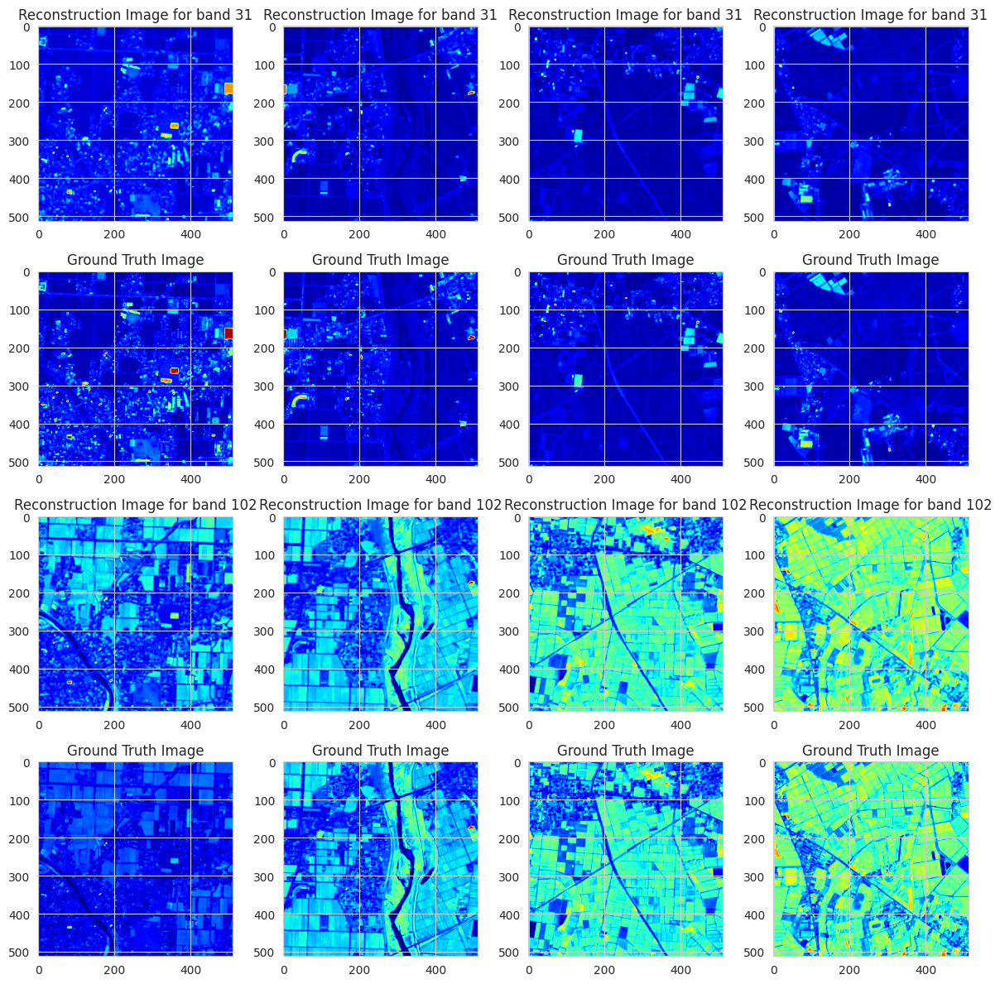

In [ ]:
import numpy as np
y = np.load('Chikusei_SSPSR_Blocks=3_Subs8_Ovls4_Feats=256.npy')
import scipy.io
# mat_file_path = 'dataset/Chikusei_x4/trains/train/block_Chikusei_train_1.mat'
mat_file_path = 'dataset/Chikusei_x4/Chikusei_test.mat'
mat_data = scipy.io.loadmat(mat_file_path)
image_data_ms = mat_data['ms']
image_data_msb = mat_data['ms_bicubic']
image_data_gt = mat_data['gt']
import matplotlib.pyplot as plt
import numpy as np

q = np.random.randint(0,60)
k = np.random.randint(60,128)
# Create a figure and add four subplots
fig, axs = plt.subplots(4, 4, figsize=(12, 12))
for i in range(4):
  axs[0,i].imshow(y[i,:,:,q], cmap='jet')
  axs[0,i].set_title('Reconstruction Image for band '+str(q))
  axs[1,i].imshow(image_data_gt[i,:,:,q], cmap='jet')
  axs[1,i].set_title('Ground Truth Image')
  axs[2,i].imshow(y[i,:,:,k], cmap='jet')
  axs[2,i].set_title('Reconstruction Image for band '+str(k))
  axs[3,i].imshow(image_data_gt[i,:,:,k], cmap='jet')
  axs[3,i].set_title('Ground Truth Image')

# Adjust spacing between subplots
plt.tight_layout()

# Show the figure
plt.show()

Training Losses: [0.014816, 0.008957, 0.008333, 0.00802, 0.007771, 0.007579, 0.007414, 0.007269, 0.007188, 0.007058, 0.006977, 0.006927, 0.006952, 0.006756, 0.006621, 0.006559, 0.006531, 0.006447, 0.006415, 0.006396, 0.006327, 0.006292, 0.006237, 0.006224, 0.006174, 0.006149, 0.006145, 0.006137, 0.006067, 0.005932]
Validation Losses: [0.009687, 0.008729, 0.008255, 0.00803, 0.007826, 0.007703, 0.007605, 0.007506, 0.007439, 0.007307, 0.007265, 0.007182, 0.007195, 0.007032, 0.00696, 0.006937, 0.006875, 0.006828, 0.006878, 0.006789, 0.006878, 0.006751, 0.006694, 0.006711, 0.006635, 0.006646, 0.006642, 0.006615, 0.006617, 0.006505]


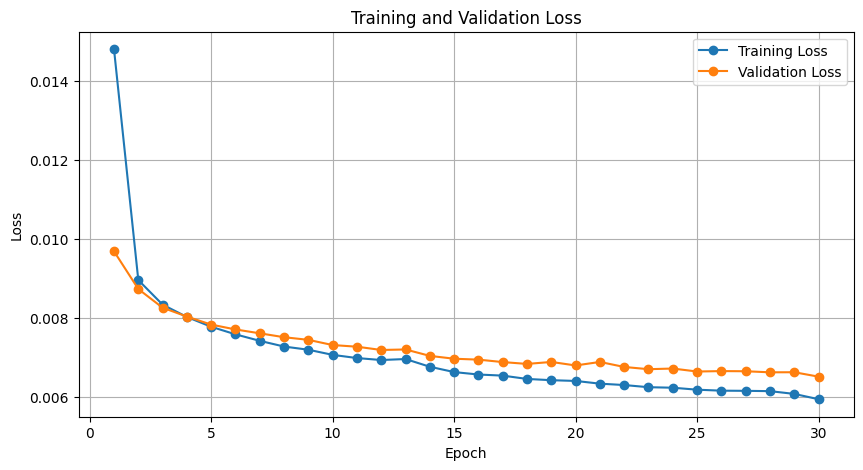

In [ ]:
import re
import matplotlib.pyplot as plt

log = """
===> Building model
===> Setting optimizer and logger
===> Start training
Start epoch 1, learning rate = 0.0001
===> Wed Sep 27 21:26:20 2023 B3 Sub8 Fea256 GPU0,1	Epoch[1](1/159): Loss: 0.110436
===> Wed Sep 27 21:27:43 2023 B3 Sub8 Fea256 GPU0,1	Epoch[1](51/159): Loss: 0.012105
===> Wed Sep 27 21:29:07 2023 B3 Sub8 Fea256 GPU0,1	Epoch[1](101/159): Loss: 0.010814
===> Wed Sep 27 21:30:30 2023 B3 Sub8 Fea256 GPU0,1	Epoch[1](151/159): Loss: 0.009094
===> Wed Sep 27 21:30:44 2023	Epoch 1 Training Complete: Avg. Loss: 0.014816
===> Wed Sep 27 21:31:46 2023	Epoch evaluation Complete: Avg. Loss: 0.009687
Start epoch 2, learning rate = 0.0001
===> Wed Sep 27 21:31:53 2023 B3 Sub8 Fea256 GPU0,1	Epoch[2](1/159): Loss: 0.009694
===> Wed Sep 27 21:33:19 2023 B3 Sub8 Fea256 GPU0,1	Epoch[2](51/159): Loss: 0.008590
===> Wed Sep 27 21:34:43 2023 B3 Sub8 Fea256 GPU0,1	Epoch[2](101/159): Loss: 0.008866
===> Wed Sep 27 21:36:08 2023 B3 Sub8 Fea256 GPU0,1	Epoch[2](151/159): Loss: 0.007860
===> Wed Sep 27 21:36:21 2023	Epoch 2 Training Complete: Avg. Loss: 0.008957
===> Wed Sep 27 21:36:35 2023	Epoch evaluation Complete: Avg. Loss: 0.008729
Start epoch 3, learning rate = 0.0001
===> Wed Sep 27 21:36:42 2023 B3 Sub8 Fea256 GPU0,1	Epoch[3](1/159): Loss: 0.007874
===> Wed Sep 27 21:38:09 2023 B3 Sub8 Fea256 GPU0,1	Epoch[3](51/159): Loss: 0.008136
===> Wed Sep 27 21:39:34 2023 B3 Sub8 Fea256 GPU0,1	Epoch[3](101/159): Loss: 0.008574
===> Wed Sep 27 21:40:59 2023 B3 Sub8 Fea256 GPU0,1	Epoch[3](151/159): Loss: 0.008212
===> Wed Sep 27 21:41:12 2023	Epoch 3 Training Complete: Avg. Loss: 0.008333
===> Wed Sep 27 21:41:27 2023	Epoch evaluation Complete: Avg. Loss: 0.008255
Start epoch 4, learning rate = 0.0001
===> Wed Sep 27 21:41:35 2023 B3 Sub8 Fea256 GPU0,1	Epoch[4](1/159): Loss: 0.007426
===> Wed Sep 27 21:43:02 2023 B3 Sub8 Fea256 GPU0,1	Epoch[4](51/159): Loss: 0.008250
===> Wed Sep 27 21:44:27 2023 B3 Sub8 Fea256 GPU0,1	Epoch[4](101/159): Loss: 0.008097
===> Wed Sep 27 21:45:51 2023 B3 Sub8 Fea256 GPU0,1	Epoch[4](151/159): Loss: 0.007533
===> Wed Sep 27 21:46:05 2023	Epoch 4 Training Complete: Avg. Loss: 0.008020
===> Wed Sep 27 21:46:19 2023	Epoch evaluation Complete: Avg. Loss: 0.008030
Start epoch 5, learning rate = 0.0001
===> Wed Sep 27 21:46:26 2023 B3 Sub8 Fea256 GPU0,1	Epoch[5](1/159): Loss: 0.008517
===> Wed Sep 27 21:47:54 2023 B3 Sub8 Fea256 GPU0,1	Epoch[5](51/159): Loss: 0.007516
===> Wed Sep 27 21:49:18 2023 B3 Sub8 Fea256 GPU0,1	Epoch[5](101/159): Loss: 0.007931
===> Wed Sep 27 21:50:43 2023 B3 Sub8 Fea256 GPU0,1	Epoch[5](151/159): Loss: 0.007327
===> Wed Sep 27 21:50:57 2023	Epoch 5 Training Complete: Avg. Loss: 0.007771
===> Wed Sep 27 21:51:10 2023	Epoch evaluation Complete: Avg. Loss: 0.007826
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls4_Feats=256_ckpt_epoch_5.pth
Start epoch 6, learning rate = 0.0001
===> Wed Sep 27 21:51:20 2023 B3 Sub8 Fea256 GPU0,1	Epoch[6](1/159): Loss: 0.007272
===> Wed Sep 27 21:52:48 2023 B3 Sub8 Fea256 GPU0,1	Epoch[6](51/159): Loss: 0.007709
===> Wed Sep 27 21:54:13 2023 B3 Sub8 Fea256 GPU0,1	Epoch[6](101/159): Loss: 0.007304
===> Wed Sep 27 21:55:38 2023 B3 Sub8 Fea256 GPU0,1	Epoch[6](151/159): Loss: 0.007366
===> Wed Sep 27 21:55:51 2023	Epoch 6 Training Complete: Avg. Loss: 0.007579
===> Wed Sep 27 21:56:05 2023	Epoch evaluation Complete: Avg. Loss: 0.007703
Start epoch 7, learning rate = 0.0001
===> Wed Sep 27 21:56:12 2023 B3 Sub8 Fea256 GPU0,1	Epoch[7](1/159): Loss: 0.008231
===> Wed Sep 27 21:57:39 2023 B3 Sub8 Fea256 GPU0,1	Epoch[7](51/159): Loss: 0.007641
===> Wed Sep 27 21:59:04 2023 B3 Sub8 Fea256 GPU0,1	Epoch[7](101/159): Loss: 0.007379
===> Wed Sep 27 22:00:30 2023 B3 Sub8 Fea256 GPU0,1	Epoch[7](151/159): Loss: 0.007418
===> Wed Sep 27 22:00:43 2023	Epoch 7 Training Complete: Avg. Loss: 0.007414
===> Wed Sep 27 22:00:57 2023	Epoch evaluation Complete: Avg. Loss: 0.007605
Start epoch 8, learning rate = 0.0001
===> Wed Sep 27 22:01:04 2023 B3 Sub8 Fea256 GPU0,1	Epoch[8](1/159): Loss: 0.006844
===> Wed Sep 27 22:02:30 2023 B3 Sub8 Fea256 GPU0,1	Epoch[8](51/159): Loss: 0.007449
===> Wed Sep 27 22:03:56 2023 B3 Sub8 Fea256 GPU0,1	Epoch[8](101/159): Loss: 0.006769
===> Wed Sep 27 22:05:21 2023 B3 Sub8 Fea256 GPU0,1	Epoch[8](151/159): Loss: 0.007114
===> Wed Sep 27 22:05:34 2023	Epoch 8 Training Complete: Avg. Loss: 0.007269
===> Wed Sep 27 22:05:49 2023	Epoch evaluation Complete: Avg. Loss: 0.007506
Start epoch 9, learning rate = 0.0001
===> Wed Sep 27 22:05:56 2023 B3 Sub8 Fea256 GPU0,1	Epoch[9](1/159): Loss: 0.007858
===> Wed Sep 27 22:07:23 2023 B3 Sub8 Fea256 GPU0,1	Epoch[9](51/159): Loss: 0.007722
===> Wed Sep 27 22:08:48 2023 B3 Sub8 Fea256 GPU0,1	Epoch[9](101/159): Loss: 0.007365
===> Wed Sep 27 22:10:13 2023 B3 Sub8 Fea256 GPU0,1	Epoch[9](151/159): Loss: 0.006932
===> Wed Sep 27 22:10:27 2023	Epoch 9 Training Complete: Avg. Loss: 0.007188
===> Wed Sep 27 22:10:40 2023	Epoch evaluation Complete: Avg. Loss: 0.007439
Start epoch 10, learning rate = 0.0001
===> Wed Sep 27 22:10:48 2023 B3 Sub8 Fea256 GPU0,1	Epoch[10](1/159): Loss: 0.007226
===> Wed Sep 27 22:12:15 2023 B3 Sub8 Fea256 GPU0,1	Epoch[10](51/159): Loss: 0.007205
===> Wed Sep 27 22:13:39 2023 B3 Sub8 Fea256 GPU0,1	Epoch[10](101/159): Loss: 0.007261
===> Wed Sep 27 22:15:04 2023 B3 Sub8 Fea256 GPU0,1	Epoch[10](151/159): Loss: 0.006995
===> Wed Sep 27 22:15:18 2023	Epoch 10 Training Complete: Avg. Loss: 0.007058
===> Wed Sep 27 22:15:32 2023	Epoch evaluation Complete: Avg. Loss: 0.007307
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls4_Feats=256_ckpt_epoch_10.pth
Start epoch 11, learning rate = 0.0001
===> Wed Sep 27 22:15:39 2023 B3 Sub8 Fea256 GPU0,1	Epoch[11](1/159): Loss: 0.006804
===> Wed Sep 27 22:17:06 2023 B3 Sub8 Fea256 GPU0,1	Epoch[11](51/159): Loss: 0.007097
===> Wed Sep 27 22:18:31 2023 B3 Sub8 Fea256 GPU0,1	Epoch[11](101/159): Loss: 0.007338
===> Wed Sep 27 22:19:56 2023 B3 Sub8 Fea256 GPU0,1	Epoch[11](151/159): Loss: 0.006749
===> Wed Sep 27 22:20:10 2023	Epoch 11 Training Complete: Avg. Loss: 0.006977
===> Wed Sep 27 22:20:24 2023	Epoch evaluation Complete: Avg. Loss: 0.007265
Start epoch 12, learning rate = 0.0001
===> Wed Sep 27 22:20:31 2023 B3 Sub8 Fea256 GPU0,1	Epoch[12](1/159): Loss: 0.006426
===> Wed Sep 27 22:21:57 2023 B3 Sub8 Fea256 GPU0,1	Epoch[12](51/159): Loss: 0.006615
===> Wed Sep 27 22:23:22 2023 B3 Sub8 Fea256 GPU0,1	Epoch[12](101/159): Loss: 0.007457
===> Wed Sep 27 22:24:48 2023 B3 Sub8 Fea256 GPU0,1	Epoch[12](151/159): Loss: 0.006772
===> Wed Sep 27 22:25:01 2023	Epoch 12 Training Complete: Avg. Loss: 0.006927
===> Wed Sep 27 22:25:14 2023	Epoch evaluation Complete: Avg. Loss: 0.007182
Start epoch 13, learning rate = 0.0001
===> Wed Sep 27 22:25:21 2023 B3 Sub8 Fea256 GPU0,1	Epoch[13](1/159): Loss: 0.006817
===> Wed Sep 27 22:26:48 2023 B3 Sub8 Fea256 GPU0,1	Epoch[13](51/159): Loss: 0.006650
===> Wed Sep 27 22:28:14 2023 B3 Sub8 Fea256 GPU0,1	Epoch[13](101/159): Loss: 0.006608
===> Wed Sep 27 22:29:38 2023 B3 Sub8 Fea256 GPU0,1	Epoch[13](151/159): Loss: 0.006435
===> Wed Sep 27 22:29:52 2023	Epoch 13 Training Complete: Avg. Loss: 0.006952
===> Wed Sep 27 22:30:06 2023	Epoch evaluation Complete: Avg. Loss: 0.007195
Start epoch 14, learning rate = 0.0001
===> Wed Sep 27 22:30:14 2023 B3 Sub8 Fea256 GPU0,1	Epoch[14](1/159): Loss: 0.006650
===> Wed Sep 27 22:31:40 2023 B3 Sub8 Fea256 GPU0,1	Epoch[14](51/159): Loss: 0.006284
===> Wed Sep 27 22:33:06 2023 B3 Sub8 Fea256 GPU0,1	Epoch[14](101/159): Loss: 0.007059
===> Wed Sep 27 22:34:31 2023 B3 Sub8 Fea256 GPU0,1	Epoch[14](151/159): Loss: 0.007562
===> Wed Sep 27 22:34:44 2023	Epoch 14 Training Complete: Avg. Loss: 0.006756
===> Wed Sep 27 22:34:58 2023	Epoch evaluation Complete: Avg. Loss: 0.007032
Start epoch 15, learning rate = 0.0001
===> Wed Sep 27 22:35:06 2023 B3 Sub8 Fea256 GPU0,1	Epoch[15](1/159): Loss: 0.006508
===> Wed Sep 27 22:36:32 2023 B3 Sub8 Fea256 GPU0,1	Epoch[15](51/159): Loss: 0.006652
===> Wed Sep 27 22:37:57 2023 B3 Sub8 Fea256 GPU0,1	Epoch[15](101/159): Loss: 0.006155
===> Wed Sep 27 22:39:22 2023 B3 Sub8 Fea256 GPU0,1	Epoch[15](151/159): Loss: 0.006598
===> Wed Sep 27 22:39:36 2023	Epoch 15 Training Complete: Avg. Loss: 0.006621
===> Wed Sep 27 22:39:50 2023	Epoch evaluation Complete: Avg. Loss: 0.006960
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls4_Feats=256_ckpt_epoch_15.pth
Start epoch 16, learning rate = 0.0001
===> Wed Sep 27 22:39:57 2023 B3 Sub8 Fea256 GPU0,1	Epoch[16](1/159): Loss: 0.006547
===> Wed Sep 27 22:41:24 2023 B3 Sub8 Fea256 GPU0,1	Epoch[16](51/159): Loss: 0.006501
===> Wed Sep 27 22:42:49 2023 B3 Sub8 Fea256 GPU0,1	Epoch[16](101/159): Loss: 0.007109
===> Wed Sep 27 22:44:14 2023 B3 Sub8 Fea256 GPU0,1	Epoch[16](151/159): Loss: 0.006675
===> Wed Sep 27 22:44:28 2023	Epoch 16 Training Complete: Avg. Loss: 0.006559
===> Wed Sep 27 22:44:42 2023	Epoch evaluation Complete: Avg. Loss: 0.006937
Start epoch 17, learning rate = 0.0001
===> Wed Sep 27 22:44:48 2023 B3 Sub8 Fea256 GPU0,1	Epoch[17](1/159): Loss: 0.006602
===> Wed Sep 27 22:46:15 2023 B3 Sub8 Fea256 GPU0,1	Epoch[17](51/159): Loss: 0.006835
===> Wed Sep 27 22:47:41 2023 B3 Sub8 Fea256 GPU0,1	Epoch[17](101/159): Loss: 0.006232
===> Wed Sep 27 22:49:06 2023 B3 Sub8 Fea256 GPU0,1	Epoch[17](151/159): Loss: 0.006364
===> Wed Sep 27 22:49:20 2023	Epoch 17 Training Complete: Avg. Loss: 0.006531
===> Wed Sep 27 22:49:33 2023	Epoch evaluation Complete: Avg. Loss: 0.006875
Start epoch 18, learning rate = 0.0001
===> Wed Sep 27 22:49:40 2023 B3 Sub8 Fea256 GPU0,1	Epoch[18](1/159): Loss: 0.006666
===> Wed Sep 27 22:51:07 2023 B3 Sub8 Fea256 GPU0,1	Epoch[18](51/159): Loss: 0.006648
===> Wed Sep 27 22:52:33 2023 B3 Sub8 Fea256 GPU0,1	Epoch[18](101/159): Loss: 0.006308
===> Wed Sep 27 22:53:58 2023 B3 Sub8 Fea256 GPU0,1	Epoch[18](151/159): Loss: 0.006429
===> Wed Sep 27 22:54:12 2023	Epoch 18 Training Complete: Avg. Loss: 0.006447
===> Wed Sep 27 22:54:25 2023	Epoch evaluation Complete: Avg. Loss: 0.006828
Start epoch 19, learning rate = 0.0001
===> Wed Sep 27 22:54:32 2023 B3 Sub8 Fea256 GPU0,1	Epoch[19](1/159): Loss: 0.006281
===> Wed Sep 27 22:56:00 2023 B3 Sub8 Fea256 GPU0,1	Epoch[19](51/159): Loss: 0.006771
===> Wed Sep 27 22:57:25 2023 B3 Sub8 Fea256 GPU0,1	Epoch[19](101/159): Loss: 0.005746
===> Wed Sep 27 22:58:50 2023 B3 Sub8 Fea256 GPU0,1	Epoch[19](151/159): Loss: 0.006127
===> Wed Sep 27 22:59:04 2023	Epoch 19 Training Complete: Avg. Loss: 0.006415
===> Wed Sep 27 22:59:17 2023	Epoch evaluation Complete: Avg. Loss: 0.006878
Start epoch 20, learning rate = 0.0001
===> Wed Sep 27 22:59:25 2023 B3 Sub8 Fea256 GPU0,1	Epoch[20](1/159): Loss: 0.005952
===> Wed Sep 27 23:00:52 2023 B3 Sub8 Fea256 GPU0,1	Epoch[20](51/159): Loss: 0.006495
===> Wed Sep 27 23:02:17 2023 B3 Sub8 Fea256 GPU0,1	Epoch[20](101/159): Loss: 0.006416
===> Wed Sep 27 23:03:42 2023 B3 Sub8 Fea256 GPU0,1	Epoch[20](151/159): Loss: 0.006905
===> Wed Sep 27 23:03:56 2023	Epoch 20 Training Complete: Avg. Loss: 0.006396
===> Wed Sep 27 23:04:10 2023	Epoch evaluation Complete: Avg. Loss: 0.006789
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls4_Feats=256_ckpt_epoch_20.pth
Start epoch 21, learning rate = 0.0001
===> Wed Sep 27 23:04:18 2023 B3 Sub8 Fea256 GPU0,1	Epoch[21](1/159): Loss: 0.006974
===> Wed Sep 27 23:05:44 2023 B3 Sub8 Fea256 GPU0,1	Epoch[21](51/159): Loss: 0.005842
===> Wed Sep 27 23:07:10 2023 B3 Sub8 Fea256 GPU0,1	Epoch[21](101/159): Loss: 0.006079
===> Wed Sep 27 23:08:35 2023 B3 Sub8 Fea256 GPU0,1	Epoch[21](151/159): Loss: 0.006599
===> Wed Sep 27 23:08:49 2023	Epoch 21 Training Complete: Avg. Loss: 0.006327
===> Wed Sep 27 23:09:02 2023	Epoch evaluation Complete: Avg. Loss: 0.006878
Start epoch 22, learning rate = 0.0001
===> Wed Sep 27 23:09:09 2023 B3 Sub8 Fea256 GPU0,1	Epoch[22](1/159): Loss: 0.006169
===> Wed Sep 27 23:10:36 2023 B3 Sub8 Fea256 GPU0,1	Epoch[22](51/159): Loss: 0.005974
===> Wed Sep 27 23:12:02 2023 B3 Sub8 Fea256 GPU0,1	Epoch[22](101/159): Loss: 0.006397
===> Wed Sep 27 23:13:27 2023 B3 Sub8 Fea256 GPU0,1	Epoch[22](151/159): Loss: 0.006235
===> Wed Sep 27 23:13:41 2023	Epoch 22 Training Complete: Avg. Loss: 0.006292
===> Wed Sep 27 23:13:54 2023	Epoch evaluation Complete: Avg. Loss: 0.006751
Start epoch 23, learning rate = 0.0001
===> Wed Sep 27 23:14:02 2023 B3 Sub8 Fea256 GPU0,1	Epoch[23](1/159): Loss: 0.006363
===> Wed Sep 27 23:15:29 2023 B3 Sub8 Fea256 GPU0,1	Epoch[23](51/159): Loss: 0.005957
===> Wed Sep 27 23:16:55 2023 B3 Sub8 Fea256 GPU0,1	Epoch[23](101/159): Loss: 0.006333
===> Wed Sep 27 23:18:20 2023 B3 Sub8 Fea256 GPU0,1	Epoch[23](151/159): Loss: 0.005588
===> Wed Sep 27 23:18:34 2023	Epoch 23 Training Complete: Avg. Loss: 0.006237
===> Wed Sep 27 23:18:48 2023	Epoch evaluation Complete: Avg. Loss: 0.006694
Start epoch 24, learning rate = 0.0001
===> Wed Sep 27 23:18:55 2023 B3 Sub8 Fea256 GPU0,1	Epoch[24](1/159): Loss: 0.006008
===> Wed Sep 27 23:20:22 2023 B3 Sub8 Fea256 GPU0,1	Epoch[24](51/159): Loss: 0.006306
===> Wed Sep 27 23:21:48 2023 B3 Sub8 Fea256 GPU0,1	Epoch[24](101/159): Loss: 0.005552
===> Wed Sep 27 23:23:13 2023 B3 Sub8 Fea256 GPU0,1	Epoch[24](151/159): Loss: 0.005922
===> Wed Sep 27 23:23:26 2023	Epoch 24 Training Complete: Avg. Loss: 0.006224
===> Wed Sep 27 23:23:39 2023	Epoch evaluation Complete: Avg. Loss: 0.006711
Start epoch 25, learning rate = 0.0001
===> Wed Sep 27 23:23:47 2023 B3 Sub8 Fea256 GPU0,1	Epoch[25](1/159): Loss: 0.005589
===> Wed Sep 27 23:25:13 2023 B3 Sub8 Fea256 GPU0,1	Epoch[25](51/159): Loss: 0.006585
===> Wed Sep 27 23:26:38 2023 B3 Sub8 Fea256 GPU0,1	Epoch[25](101/159): Loss: 0.006004
===> Wed Sep 27 23:28:03 2023 B3 Sub8 Fea256 GPU0,1	Epoch[25](151/159): Loss: 0.005867
===> Wed Sep 27 23:28:17 2023	Epoch 25 Training Complete: Avg. Loss: 0.006174
===> Wed Sep 27 23:28:31 2023	Epoch evaluation Complete: Avg. Loss: 0.006635
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls4_Feats=256_ckpt_epoch_25.pth
Start epoch 26, learning rate = 0.0001
===> Wed Sep 27 23:28:38 2023 B3 Sub8 Fea256 GPU0,1	Epoch[26](1/159): Loss: 0.006084
===> Wed Sep 27 23:30:05 2023 B3 Sub8 Fea256 GPU0,1	Epoch[26](51/159): Loss: 0.006012
===> Wed Sep 27 23:31:31 2023 B3 Sub8 Fea256 GPU0,1	Epoch[26](101/159): Loss: 0.005787
===> Wed Sep 27 23:32:55 2023 B3 Sub8 Fea256 GPU0,1	Epoch[26](151/159): Loss: 0.005859
===> Wed Sep 27 23:33:09 2023	Epoch 26 Training Complete: Avg. Loss: 0.006149
===> Wed Sep 27 23:33:22 2023	Epoch evaluation Complete: Avg. Loss: 0.006646
Start epoch 27, learning rate = 0.0001
===> Wed Sep 27 23:33:29 2023 B3 Sub8 Fea256 GPU0,1	Epoch[27](1/159): Loss: 0.006178
===> Wed Sep 27 23:34:55 2023 B3 Sub8 Fea256 GPU0,1	Epoch[27](51/159): Loss: 0.005911
===> Wed Sep 27 23:36:21 2023 B3 Sub8 Fea256 GPU0,1	Epoch[27](101/159): Loss: 0.005678
===> Wed Sep 27 23:37:46 2023 B3 Sub8 Fea256 GPU0,1	Epoch[27](151/159): Loss: 0.006043
===> Wed Sep 27 23:38:00 2023	Epoch 27 Training Complete: Avg. Loss: 0.006145
===> Wed Sep 27 23:38:13 2023	Epoch evaluation Complete: Avg. Loss: 0.006642
Start epoch 28, learning rate = 0.0001
===> Wed Sep 27 23:38:21 2023 B3 Sub8 Fea256 GPU0,1	Epoch[28](1/159): Loss: 0.006355
===> Wed Sep 27 23:39:47 2023 B3 Sub8 Fea256 GPU0,1	Epoch[28](51/159): Loss: 0.005389
===> Wed Sep 27 23:41:12 2023 B3 Sub8 Fea256 GPU0,1	Epoch[28](101/159): Loss: 0.006595
===> Wed Sep 27 23:42:37 2023 B3 Sub8 Fea256 GPU0,1	Epoch[28](151/159): Loss: 0.005709
===> Wed Sep 27 23:42:51 2023	Epoch 28 Training Complete: Avg. Loss: 0.006137
===> Wed Sep 27 23:43:06 2023	Epoch evaluation Complete: Avg. Loss: 0.006615
Start epoch 29, learning rate = 0.0001
===> Wed Sep 27 23:43:12 2023 B3 Sub8 Fea256 GPU0,1	Epoch[29](1/159): Loss: 0.006181
===> Wed Sep 27 23:44:39 2023 B3 Sub8 Fea256 GPU0,1	Epoch[29](51/159): Loss: 0.006188
===> Wed Sep 27 23:46:04 2023 B3 Sub8 Fea256 GPU0,1	Epoch[29](101/159): Loss: 0.005450
===> Wed Sep 27 23:47:29 2023 B3 Sub8 Fea256 GPU0,1	Epoch[29](151/159): Loss: 0.005950
===> Wed Sep 27 23:47:43 2023	Epoch 29 Training Complete: Avg. Loss: 0.006067
===> Wed Sep 27 23:47:56 2023	Epoch evaluation Complete: Avg. Loss: 0.006617
Start epoch 30, learning rate = 1e-05
===> Wed Sep 27 23:48:04 2023 B3 Sub8 Fea256 GPU0,1	Epoch[30](1/159): Loss: 0.006544
===> Wed Sep 27 23:49:30 2023 B3 Sub8 Fea256 GPU0,1	Epoch[30](51/159): Loss: 0.005909
===> Wed Sep 27 23:50:56 2023 B3 Sub8 Fea256 GPU0,1	Epoch[30](101/159): Loss: 0.005805
===> Wed Sep 27 23:52:21 2023 B3 Sub8 Fea256 GPU0,1	Epoch[30](151/159): Loss: 0.006076
===> Wed Sep 27 23:52:34 2023	Epoch 30 Training Complete: Avg. Loss: 0.005932
===> Wed Sep 27 23:52:48 2023	Epoch evaluation Complete: Avg. Loss: 0.006505
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls4_Feats=256_ckpt_epoch_30.pth
"""

# Define regular expressions to match training and validation loss lines
training_loss_pattern = re.compile(r"Training Complete: Avg. Loss: (\d+\.\d+)")
validation_loss_pattern = re.compile(r"Epoch evaluation Complete: Avg. Loss: (\d+\.\d+)")

# Initialize lists to store training and validation loss values
training_losses = []
validation_losses = []

# Find matches in the log
training_matches = training_loss_pattern.findall(log)
validation_matches = validation_loss_pattern.findall(log)

# Convert the matched values to floats and add them to the respective lists
training_losses = [float(loss) for loss in training_matches]
validation_losses = [float(loss) for loss in validation_matches]

# Print the extracted loss values
print("Training Losses:", training_losses)
print("Validation Losses:", validation_losses)

num_epochs = 30
# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), training_losses, label='Training Loss', marker='o')
plt.plot(range(1, num_epochs + 1), validation_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
!python mains.py train --dataset_name 'Chikusei' --n_blocks 3 --epochs 30 --batch_size 32 --n_subs 8 --n_ovls 6 --n_feats 256 --n_scale 4 --gpus "0,1"
# p=8, 0=6

0,1
Start seed:  3000
===> Loading datasets
./dataset/Chikusei_x4/trains_sub/
./dataset/Chikusei_x4/trains_sub/
./dataset/Chikusei_x4/trains_sub/train
['block_Chikusei_train_313.mat', 'block_Chikusei_train_3136.mat', 'block_Chikusei_train_3137.mat', 'block_Chikusei_train_3138.mat', 'block_Chikusei_train_3156.mat', 'block_Chikusei_train_3157.mat', 'block_Chikusei_train_3158.mat', 'block_Chikusei_train_3159.mat', 'block_Chikusei_train_3162.mat', 'block_Chikusei_train_3165.mat', 'block_Chikusei_train_3216.mat', 'block_Chikusei_train_3217.mat', 'block_Chikusei_train_3218.mat', 'block_Chikusei_train_3220.mat', 'block_Chikusei_train_3221.mat', 'block_Chikusei_train_3225.mat', 'block_Chikusei_train_3228.mat', 'block_Chikusei_train_3229.mat', 'block_Chikusei_train_3230.mat', 'block_Chikusei_train_3231.mat', 'block_Chikusei_train_3257.mat', 'block_Chikusei_train_3263.mat', 'block_Chikusei_train_3273.mat', 'block_Chikusei_train_3278.mat', 'block_Chikusei_train_3279.mat', 'block_Chikusei_train_32

In [ ]:
!python mains.py train --dataset_name 'Chikusei' --n_blocks 3 --epochs 30 --batch_size 32 --n_subs 8 --n_ovls 6 --n_feats 256 --n_scale 4 --gpus "0,1"
# p=8, 0=6

0,1
Start seed:  3000
===> Loading datasets
./dataset/Chikusei_x4/trains_sub/
./dataset/Chikusei_x4/trains_sub/
./dataset/Chikusei_x4/trains_sub/train
['block_Chikusei_train_313.mat', 'block_Chikusei_train_3136.mat', 'block_Chikusei_train_3137.mat', 'block_Chikusei_train_3138.mat', 'block_Chikusei_train_3156.mat', 'block_Chikusei_train_3157.mat', 'block_Chikusei_train_3158.mat', 'block_Chikusei_train_3159.mat', 'block_Chikusei_train_3162.mat', 'block_Chikusei_train_3165.mat', 'block_Chikusei_train_3216.mat', 'block_Chikusei_train_3217.mat', 'block_Chikusei_train_3218.mat', 'block_Chikusei_train_3220.mat', 'block_Chikusei_train_3221.mat', 'block_Chikusei_train_3225.mat', 'block_Chikusei_train_3228.mat', 'block_Chikusei_train_3229.mat', 'block_Chikusei_train_3230.mat', 'block_Chikusei_train_3231.mat', 'block_Chikusei_train_3257.mat', 'block_Chikusei_train_3263.mat', 'block_Chikusei_train_3273.mat', 'block_Chikusei_train_3278.mat', 'block_Chikusei_train_3279.mat', 'block_Chikusei_train_32

In [ ]:
!python mains.py train --dataset_name 'Chikusei' --n_blocks 3 --epochs 30 --batch_size 32 --n_subs 8 --n_ovls 6 --n_feats 256 --n_scale 4 --gpus "0,1"
# p=8, 0=6

# Using PSNR subset data

Hypothesis: The objective of achieving a PSNR exceeding 40 is to enhance the quality of reconstructed images, indicating that the superresolution process aims to produce high-fidelity results with minimal distortion compared to the original data.

Using PSNR here since it's a good measure of noise level or distortion in image and our end goal is reconstruction, we tried to subset data using this. Dimensionality reduction could also help here but our end goal is not classification based on different land features.

In [ ]:
!python mains.py train --dataset_name 'Chikusei' --n_blocks 3 --epochs 30 --batch_size 32 --n_subs 8 --n_ovls 2 --n_feats 256 --n_scale 4 --gpus "0,1"
# p=8,o=2,d=4

0,1
Start seed:  3000
===> Loading datasets
./dataset/Chikusei_x4/trains_sub_psnr/
./dataset/Chikusei_x4/trains_sub_psnr/
./dataset/Chikusei_x4/trains_sub_psnr/train
['block_Chikusei_train_19.mat', 'block_Chikusei_train_20.mat', 'block_Chikusei_train_29.mat', 'block_Chikusei_train_30.mat', 'block_Chikusei_train_38.mat', 'block_Chikusei_train_39.mat', 'block_Chikusei_train_49.mat', 'block_Chikusei_train_50.mat', 'block_Chikusei_train_83.mat', 'block_Chikusei_train_92.mat', 'block_Chikusei_train_93.mat', 'block_Chikusei_train_101.mat', 'block_Chikusei_train_102.mat', 'block_Chikusei_train_113.mat', 'block_Chikusei_train_155.mat', 'block_Chikusei_train_160.mat', 'block_Chikusei_train_164.mat', 'block_Chikusei_train_165.mat', 'block_Chikusei_train_176.mat', 'block_Chikusei_train_181.mat', 'block_Chikusei_train_217.mat', 'block_Chikusei_train_218.mat', 'block_Chikusei_train_219.mat', 'block_Chikusei_train_239.mat', 'block_Chikusei_train_244.mat', 'block_Chikusei_train_280.mat', 'block_Chiku

Test finished, test results saved to .npy file at  Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256.npy
{'MPSNR': 39.182606374497084, 'CrossCorrelation': 0.9434599280357361, 'RMSE': 0.012940277751126456, 'MSSIM': 0.9317165464162827, 'SAM': 2.864884997393984, 'ERGAS': 5.746362873051118}

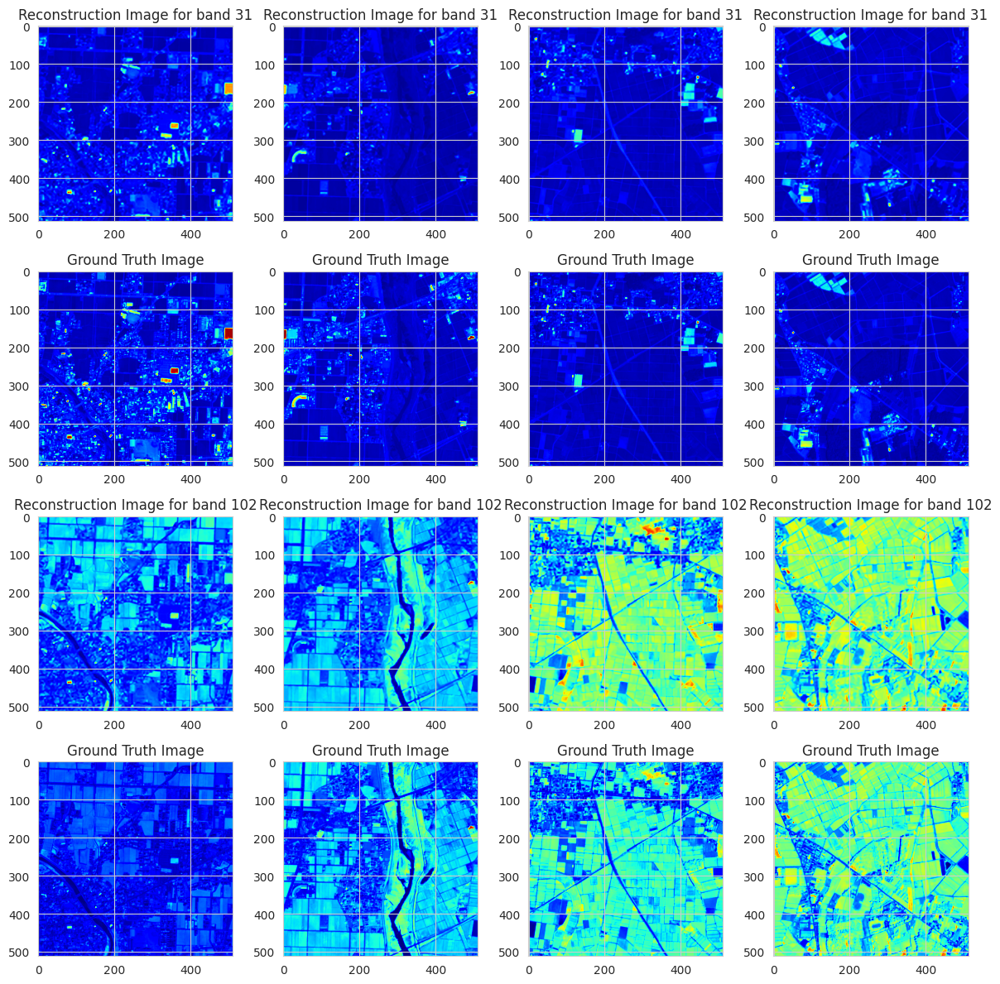

In [ ]:
import numpy as np
y = np.load('Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256_psnr.npy')
import scipy.io
# mat_file_path = 'dataset/Chikusei_x4/trains/train/block_Chikusei_train_1.mat'
mat_file_path = 'dataset/Chikusei_x4/Chikusei_test.mat'
mat_data = scipy.io.loadmat(mat_file_path)
image_data_ms = mat_data['ms']
image_data_msb = mat_data['ms_bicubic']
image_data_gt = mat_data['gt']
import matplotlib.pyplot as plt
import numpy as np

q = np.random.randint(0,60)
k = np.random.randint(60,128)
# Create a figure and add four subplots
fig, axs = plt.subplots(4, 4, figsize=(12, 12))
for i in range(4):
  axs[0,i].imshow(y[i,:,:,q], cmap='jet')
  axs[0,i].set_title('Reconstruction Image for band '+str(q))
  axs[1,i].imshow(image_data_gt[i,:,:,q], cmap='jet')
  axs[1,i].set_title('Ground Truth Image')
  axs[2,i].imshow(y[i,:,:,k], cmap='jet')
  axs[2,i].set_title('Reconstruction Image for band '+str(k))
  axs[3,i].imshow(image_data_gt[i,:,:,k], cmap='jet')
  axs[3,i].set_title('Ground Truth Image')

# Adjust spacing between subplots
plt.tight_layout()

# Show the figure
plt.show()

Training Losses: [0.010907, 0.005585, 0.004998, 0.004717, 0.004513, 0.00436, 0.004254, 0.004217, 0.004068, 0.003998, 0.003914, 0.003868, 0.003825, 0.003769, 0.003731, 0.003753, 0.00384, 0.003617, 0.003576, 0.003517, 0.003512, 0.003543, 0.00347, 0.003409, 0.003384, 0.003346, 0.003339, 0.003361, 0.003331, 0.003189]
Validation Losses: [0.010178, 0.009079, 0.00853, 0.008276, 0.008161, 0.007996, 0.007938, 0.007801, 0.007774, 0.007608, 0.007569, 0.007518, 0.007451, 0.007399, 0.007361, 0.008186, 0.007279, 0.007222, 0.007141, 0.007151, 0.007168, 0.007093, 0.007055, 0.006988, 0.006946, 0.006922, 0.006957, 0.006903, 0.006914, 0.006807]


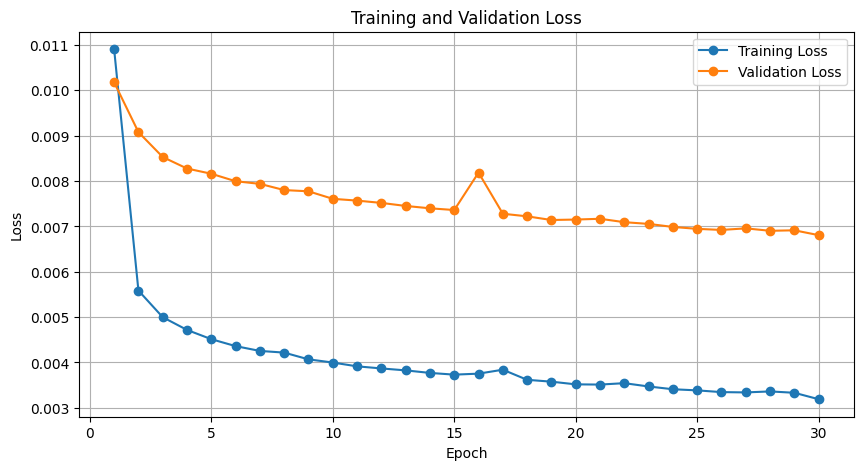

In [ ]:
import re
import matplotlib.pyplot as plt

log = """
===> Building model
===> Setting optimizer and logger
===> Start training
Start epoch 1, learning rate = 0.0001
===> Thu Sep 28 20:10:46 2023 B3 Sub8 Fea256 GPU0,1	Epoch[1](1/166): Loss: 0.098763
===> Thu Sep 28 20:11:44 2023 B3 Sub8 Fea256 GPU0,1	Epoch[1](51/166): Loss: 0.008224
===> Thu Sep 28 20:12:46 2023 B3 Sub8 Fea256 GPU0,1	Epoch[1](101/166): Loss: 0.007036
===> Thu Sep 28 20:13:47 2023 B3 Sub8 Fea256 GPU0,1	Epoch[1](151/166): Loss: 0.006429
===> Thu Sep 28 20:14:14 2023	Epoch 1 Training Complete: Avg. Loss: 0.010907
===> Thu Sep 28 20:15:16 2023	Epoch evaluation Complete: Avg. Loss: 0.010178
Start epoch 2, learning rate = 0.0001
===> Thu Sep 28 20:15:24 2023 B3 Sub8 Fea256 GPU0,1	Epoch[2](1/166): Loss: 0.005995
===> Thu Sep 28 20:16:28 2023 B3 Sub8 Fea256 GPU0,1	Epoch[2](51/166): Loss: 0.005621
===> Thu Sep 28 20:17:36 2023 B3 Sub8 Fea256 GPU0,1	Epoch[2](101/166): Loss: 0.005302
===> Thu Sep 28 20:18:39 2023 B3 Sub8 Fea256 GPU0,1	Epoch[2](151/166): Loss: 0.005273
===> Thu Sep 28 20:18:57 2023	Epoch 2 Training Complete: Avg. Loss: 0.005585
===> Thu Sep 28 20:19:09 2023	Epoch evaluation Complete: Avg. Loss: 0.009079
Start epoch 3, learning rate = 0.0001
===> Thu Sep 28 20:19:18 2023 B3 Sub8 Fea256 GPU0,1	Epoch[3](1/166): Loss: 0.005234
===> Thu Sep 28 20:20:22 2023 B3 Sub8 Fea256 GPU0,1	Epoch[3](51/166): Loss: 0.005195
===> Thu Sep 28 20:21:24 2023 B3 Sub8 Fea256 GPU0,1	Epoch[3](101/166): Loss: 0.004921
===> Thu Sep 28 20:22:28 2023 B3 Sub8 Fea256 GPU0,1	Epoch[3](151/166): Loss: 0.005086
===> Thu Sep 28 20:22:46 2023	Epoch 3 Training Complete: Avg. Loss: 0.004998
===> Thu Sep 28 20:22:58 2023	Epoch evaluation Complete: Avg. Loss: 0.008530
Start epoch 4, learning rate = 0.0001
===> Thu Sep 28 20:23:06 2023 B3 Sub8 Fea256 GPU0,1	Epoch[4](1/166): Loss: 0.004862
===> Thu Sep 28 20:24:11 2023 B3 Sub8 Fea256 GPU0,1	Epoch[4](51/166): Loss: 0.004780
===> Thu Sep 28 20:25:13 2023 B3 Sub8 Fea256 GPU0,1	Epoch[4](101/166): Loss: 0.004839
===> Thu Sep 28 20:26:16 2023 B3 Sub8 Fea256 GPU0,1	Epoch[4](151/166): Loss: 0.004648
===> Thu Sep 28 20:26:35 2023	Epoch 4 Training Complete: Avg. Loss: 0.004717
===> Thu Sep 28 20:26:46 2023	Epoch evaluation Complete: Avg. Loss: 0.008276
Start epoch 5, learning rate = 0.0001
===> Thu Sep 28 20:26:55 2023 B3 Sub8 Fea256 GPU0,1	Epoch[5](1/166): Loss: 0.004513
===> Thu Sep 28 20:27:59 2023 B3 Sub8 Fea256 GPU0,1	Epoch[5](51/166): Loss: 0.004332
===> Thu Sep 28 20:29:03 2023 B3 Sub8 Fea256 GPU0,1	Epoch[5](101/166): Loss: 0.004604
===> Thu Sep 28 20:30:07 2023 B3 Sub8 Fea256 GPU0,1	Epoch[5](151/166): Loss: 0.004468
===> Thu Sep 28 20:30:25 2023	Epoch 5 Training Complete: Avg. Loss: 0.004513
===> Thu Sep 28 20:30:38 2023	Epoch evaluation Complete: Avg. Loss: 0.008161
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256_ckpt_epoch_5.pth
Start epoch 6, learning rate = 0.0001
===> Thu Sep 28 20:30:47 2023 B3 Sub8 Fea256 GPU0,1	Epoch[6](1/166): Loss: 0.004520
===> Thu Sep 28 20:31:51 2023 B3 Sub8 Fea256 GPU0,1	Epoch[6](51/166): Loss: 0.004394
===> Thu Sep 28 20:32:54 2023 B3 Sub8 Fea256 GPU0,1	Epoch[6](101/166): Loss: 0.004357
===> Thu Sep 28 20:33:57 2023 B3 Sub8 Fea256 GPU0,1	Epoch[6](151/166): Loss: 0.004222
===> Thu Sep 28 20:34:16 2023	Epoch 6 Training Complete: Avg. Loss: 0.004360
===> Thu Sep 28 20:34:28 2023	Epoch evaluation Complete: Avg. Loss: 0.007996
Start epoch 7, learning rate = 0.0001
===> Thu Sep 28 20:34:36 2023 B3 Sub8 Fea256 GPU0,1	Epoch[7](1/166): Loss: 0.004251
===> Thu Sep 28 20:35:41 2023 B3 Sub8 Fea256 GPU0,1	Epoch[7](51/166): Loss: 0.004351
===> Thu Sep 28 20:36:45 2023 B3 Sub8 Fea256 GPU0,1	Epoch[7](101/166): Loss: 0.004019
===> Thu Sep 28 20:37:48 2023 B3 Sub8 Fea256 GPU0,1	Epoch[7](151/166): Loss: 0.004227
===> Thu Sep 28 20:38:06 2023	Epoch 7 Training Complete: Avg. Loss: 0.004254
===> Thu Sep 28 20:38:19 2023	Epoch evaluation Complete: Avg. Loss: 0.007938
Start epoch 8, learning rate = 0.0001
===> Thu Sep 28 20:38:28 2023 B3 Sub8 Fea256 GPU0,1	Epoch[8](1/166): Loss: 0.004231
===> Thu Sep 28 20:39:34 2023 B3 Sub8 Fea256 GPU0,1	Epoch[8](51/166): Loss: 0.004322
===> Thu Sep 28 20:40:38 2023 B3 Sub8 Fea256 GPU0,1	Epoch[8](101/166): Loss: 0.004162
===> Thu Sep 28 20:41:41 2023 B3 Sub8 Fea256 GPU0,1	Epoch[8](151/166): Loss: 0.004098
===> Thu Sep 28 20:41:59 2023	Epoch 8 Training Complete: Avg. Loss: 0.004217
===> Thu Sep 28 20:42:12 2023	Epoch evaluation Complete: Avg. Loss: 0.007801
Start epoch 9, learning rate = 0.0001
===> Thu Sep 28 20:42:21 2023 B3 Sub8 Fea256 GPU0,1	Epoch[9](1/166): Loss: 0.004012
===> Thu Sep 28 20:43:25 2023 B3 Sub8 Fea256 GPU0,1	Epoch[9](51/166): Loss: 0.004139
===> Thu Sep 28 20:44:29 2023 B3 Sub8 Fea256 GPU0,1	Epoch[9](101/166): Loss: 0.004084
===> Thu Sep 28 20:45:32 2023 B3 Sub8 Fea256 GPU0,1	Epoch[9](151/166): Loss: 0.004009
===> Thu Sep 28 20:45:50 2023	Epoch 9 Training Complete: Avg. Loss: 0.004068
===> Thu Sep 28 20:46:02 2023	Epoch evaluation Complete: Avg. Loss: 0.007774
Start epoch 10, learning rate = 0.0001
===> Thu Sep 28 20:46:10 2023 B3 Sub8 Fea256 GPU0,1	Epoch[10](1/166): Loss: 0.004181
===> Thu Sep 28 20:47:15 2023 B3 Sub8 Fea256 GPU0,1	Epoch[10](51/166): Loss: 0.003918
===> Thu Sep 28 20:48:19 2023 B3 Sub8 Fea256 GPU0,1	Epoch[10](101/166): Loss: 0.004046
===> Thu Sep 28 20:49:22 2023 B3 Sub8 Fea256 GPU0,1	Epoch[10](151/166): Loss: 0.004013
===> Thu Sep 28 20:49:40 2023	Epoch 10 Training Complete: Avg. Loss: 0.003998
===> Thu Sep 28 20:49:52 2023	Epoch evaluation Complete: Avg. Loss: 0.007608
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256_ckpt_epoch_10.pth
Start epoch 11, learning rate = 0.0001
===> Thu Sep 28 20:50:01 2023 B3 Sub8 Fea256 GPU0,1	Epoch[11](1/166): Loss: 0.003735
===> Thu Sep 28 20:51:07 2023 B3 Sub8 Fea256 GPU0,1	Epoch[11](51/166): Loss: 0.003753
===> Thu Sep 28 20:52:10 2023 B3 Sub8 Fea256 GPU0,1	Epoch[11](101/166): Loss: 0.003979
===> Thu Sep 28 20:53:13 2023 B3 Sub8 Fea256 GPU0,1	Epoch[11](151/166): Loss: 0.003776
===> Thu Sep 28 20:53:32 2023	Epoch 11 Training Complete: Avg. Loss: 0.003914
===> Thu Sep 28 20:53:44 2023	Epoch evaluation Complete: Avg. Loss: 0.007569
Start epoch 12, learning rate = 0.0001
===> Thu Sep 28 20:53:53 2023 B3 Sub8 Fea256 GPU0,1	Epoch[12](1/166): Loss: 0.003603
===> Thu Sep 28 20:54:59 2023 B3 Sub8 Fea256 GPU0,1	Epoch[12](51/166): Loss: 0.003975
===> Thu Sep 28 20:56:02 2023 B3 Sub8 Fea256 GPU0,1	Epoch[12](101/166): Loss: 0.004011
===> Thu Sep 28 20:57:05 2023 B3 Sub8 Fea256 GPU0,1	Epoch[12](151/166): Loss: 0.003809
===> Thu Sep 28 20:57:24 2023	Epoch 12 Training Complete: Avg. Loss: 0.003868
===> Thu Sep 28 20:57:35 2023	Epoch evaluation Complete: Avg. Loss: 0.007518
Start epoch 13, learning rate = 0.0001
===> Thu Sep 28 20:57:44 2023 B3 Sub8 Fea256 GPU0,1	Epoch[13](1/166): Loss: 0.003830
===> Thu Sep 28 20:58:50 2023 B3 Sub8 Fea256 GPU0,1	Epoch[13](51/166): Loss: 0.003821
===> Thu Sep 28 20:59:53 2023 B3 Sub8 Fea256 GPU0,1	Epoch[13](101/166): Loss: 0.003781
===> Thu Sep 28 21:00:56 2023 B3 Sub8 Fea256 GPU0,1	Epoch[13](151/166): Loss: 0.003719
===> Thu Sep 28 21:01:14 2023	Epoch 13 Training Complete: Avg. Loss: 0.003825
===> Thu Sep 28 21:01:26 2023	Epoch evaluation Complete: Avg. Loss: 0.007451
Start epoch 14, learning rate = 0.0001
===> Thu Sep 28 21:01:35 2023 B3 Sub8 Fea256 GPU0,1	Epoch[14](1/166): Loss: 0.003623
===> Thu Sep 28 21:02:41 2023 B3 Sub8 Fea256 GPU0,1	Epoch[14](51/166): Loss: 0.003878
===> Thu Sep 28 21:03:44 2023 B3 Sub8 Fea256 GPU0,1	Epoch[14](101/166): Loss: 0.003774
===> Thu Sep 28 21:04:47 2023 B3 Sub8 Fea256 GPU0,1	Epoch[14](151/166): Loss: 0.003736
===> Thu Sep 28 21:05:06 2023	Epoch 14 Training Complete: Avg. Loss: 0.003769
===> Thu Sep 28 21:05:19 2023	Epoch evaluation Complete: Avg. Loss: 0.007399
Start epoch 15, learning rate = 0.0001
===> Thu Sep 28 21:05:27 2023 B3 Sub8 Fea256 GPU0,1	Epoch[15](1/166): Loss: 0.004004
===> Thu Sep 28 21:06:34 2023 B3 Sub8 Fea256 GPU0,1	Epoch[15](51/166): Loss: 0.003875
===> Thu Sep 28 21:07:37 2023 B3 Sub8 Fea256 GPU0,1	Epoch[15](101/166): Loss: 0.003519
===> Thu Sep 28 21:08:41 2023 B3 Sub8 Fea256 GPU0,1	Epoch[15](151/166): Loss: 0.003640
===> Thu Sep 28 21:08:59 2023	Epoch 15 Training Complete: Avg. Loss: 0.003731
===> Thu Sep 28 21:09:11 2023	Epoch evaluation Complete: Avg. Loss: 0.007361
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256_ckpt_epoch_15.pth
Start epoch 16, learning rate = 0.0001
===> Thu Sep 28 21:09:21 2023 B3 Sub8 Fea256 GPU0,1	Epoch[16](1/166): Loss: 0.003586
===> Thu Sep 28 21:10:28 2023 B3 Sub8 Fea256 GPU0,1	Epoch[16](51/166): Loss: 0.003613
===> Thu Sep 28 21:11:31 2023 B3 Sub8 Fea256 GPU0,1	Epoch[16](101/166): Loss: 0.003836
===> Thu Sep 28 21:12:34 2023 B3 Sub8 Fea256 GPU0,1	Epoch[16](151/166): Loss: 0.003687
===> Thu Sep 28 21:12:52 2023	Epoch 16 Training Complete: Avg. Loss: 0.003753
===> Thu Sep 28 21:13:05 2023	Epoch evaluation Complete: Avg. Loss: 0.008186
Start epoch 17, learning rate = 0.0001
===> Thu Sep 28 21:13:14 2023 B3 Sub8 Fea256 GPU0,1	Epoch[17](1/166): Loss: 0.004904
===> Thu Sep 28 21:14:19 2023 B3 Sub8 Fea256 GPU0,1	Epoch[17](51/166): Loss: 0.003680
===> Thu Sep 28 21:15:23 2023 B3 Sub8 Fea256 GPU0,1	Epoch[17](101/166): Loss: 0.003716
===> Thu Sep 28 21:16:27 2023 B3 Sub8 Fea256 GPU0,1	Epoch[17](151/166): Loss: 0.003577
===> Thu Sep 28 21:16:45 2023	Epoch 17 Training Complete: Avg. Loss: 0.003840
===> Thu Sep 28 21:16:58 2023	Epoch evaluation Complete: Avg. Loss: 0.007279
Start epoch 18, learning rate = 0.0001
===> Thu Sep 28 21:17:07 2023 B3 Sub8 Fea256 GPU0,1	Epoch[18](1/166): Loss: 0.003682
===> Thu Sep 28 21:18:13 2023 B3 Sub8 Fea256 GPU0,1	Epoch[18](51/166): Loss: 0.003582
===> Thu Sep 28 21:19:16 2023 B3 Sub8 Fea256 GPU0,1	Epoch[18](101/166): Loss: 0.003584
===> Thu Sep 28 21:20:20 2023 B3 Sub8 Fea256 GPU0,1	Epoch[18](151/166): Loss: 0.003689
===> Thu Sep 28 21:20:38 2023	Epoch 18 Training Complete: Avg. Loss: 0.003617
===> Thu Sep 28 21:20:50 2023	Epoch evaluation Complete: Avg. Loss: 0.007222
Start epoch 19, learning rate = 0.0001
===> Thu Sep 28 21:21:00 2023 B3 Sub8 Fea256 GPU0,1	Epoch[19](1/166): Loss: 0.003461
===> Thu Sep 28 21:22:06 2023 B3 Sub8 Fea256 GPU0,1	Epoch[19](51/166): Loss: 0.003733
===> Thu Sep 28 21:23:09 2023 B3 Sub8 Fea256 GPU0,1	Epoch[19](101/166): Loss: 0.003608
===> Thu Sep 28 21:24:13 2023 B3 Sub8 Fea256 GPU0,1	Epoch[19](151/166): Loss: 0.003597
===> Thu Sep 28 21:24:32 2023	Epoch 19 Training Complete: Avg. Loss: 0.003576
===> Thu Sep 28 21:24:44 2023	Epoch evaluation Complete: Avg. Loss: 0.007141
Start epoch 20, learning rate = 0.0001
===> Thu Sep 28 21:24:53 2023 B3 Sub8 Fea256 GPU0,1	Epoch[20](1/166): Loss: 0.003574
===> Thu Sep 28 21:25:58 2023 B3 Sub8 Fea256 GPU0,1	Epoch[20](51/166): Loss: 0.003500
===> Thu Sep 28 21:27:02 2023 B3 Sub8 Fea256 GPU0,1	Epoch[20](101/166): Loss: 0.003625
===> Thu Sep 28 21:28:06 2023 B3 Sub8 Fea256 GPU0,1	Epoch[20](151/166): Loss: 0.003715
===> Thu Sep 28 21:28:24 2023	Epoch 20 Training Complete: Avg. Loss: 0.003517
===> Thu Sep 28 21:28:37 2023	Epoch evaluation Complete: Avg. Loss: 0.007151
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256_ckpt_epoch_20.pth
Start epoch 21, learning rate = 0.0001
===> Thu Sep 28 21:28:46 2023 B3 Sub8 Fea256 GPU0,1	Epoch[21](1/166): Loss: 0.003479
===> Thu Sep 28 21:29:51 2023 B3 Sub8 Fea256 GPU0,1	Epoch[21](51/166): Loss: 0.003476
===> Thu Sep 28 21:30:55 2023 B3 Sub8 Fea256 GPU0,1	Epoch[21](101/166): Loss: 0.003453
===> Thu Sep 28 21:31:58 2023 B3 Sub8 Fea256 GPU0,1	Epoch[21](151/166): Loss: 0.003678
===> Thu Sep 28 21:32:17 2023	Epoch 21 Training Complete: Avg. Loss: 0.003512
===> Thu Sep 28 21:32:29 2023	Epoch evaluation Complete: Avg. Loss: 0.007168
Start epoch 22, learning rate = 0.0001
===> Thu Sep 28 21:32:38 2023 B3 Sub8 Fea256 GPU0,1	Epoch[22](1/166): Loss: 0.003398
===> Thu Sep 28 21:33:44 2023 B3 Sub8 Fea256 GPU0,1	Epoch[22](51/166): Loss: 0.003661
===> Thu Sep 28 21:34:48 2023 B3 Sub8 Fea256 GPU0,1	Epoch[22](101/166): Loss: 0.003541
===> Thu Sep 28 21:35:51 2023 B3 Sub8 Fea256 GPU0,1	Epoch[22](151/166): Loss: 0.003604
===> Thu Sep 28 21:36:10 2023	Epoch 22 Training Complete: Avg. Loss: 0.003543
===> Thu Sep 28 21:36:22 2023	Epoch evaluation Complete: Avg. Loss: 0.007093
Start epoch 23, learning rate = 0.0001
===> Thu Sep 28 21:36:32 2023 B3 Sub8 Fea256 GPU0,1	Epoch[23](1/166): Loss: 0.003498
===> Thu Sep 28 21:37:38 2023 B3 Sub8 Fea256 GPU0,1	Epoch[23](51/166): Loss: 0.003479
===> Thu Sep 28 21:38:41 2023 B3 Sub8 Fea256 GPU0,1	Epoch[23](101/166): Loss: 0.003374
===> Thu Sep 28 21:39:44 2023 B3 Sub8 Fea256 GPU0,1	Epoch[23](151/166): Loss: 0.003566
===> Thu Sep 28 21:40:03 2023	Epoch 23 Training Complete: Avg. Loss: 0.003470
===> Thu Sep 28 21:40:15 2023	Epoch evaluation Complete: Avg. Loss: 0.007055
Start epoch 24, learning rate = 0.0001
===> Thu Sep 28 21:40:25 2023 B3 Sub8 Fea256 GPU0,1	Epoch[24](1/166): Loss: 0.003460
===> Thu Sep 28 21:41:30 2023 B3 Sub8 Fea256 GPU0,1	Epoch[24](51/166): Loss: 0.003401
===> Thu Sep 28 21:42:33 2023 B3 Sub8 Fea256 GPU0,1	Epoch[24](101/166): Loss: 0.003345
===> Thu Sep 28 21:43:37 2023 B3 Sub8 Fea256 GPU0,1	Epoch[24](151/166): Loss: 0.003380
===> Thu Sep 28 21:43:55 2023	Epoch 24 Training Complete: Avg. Loss: 0.003409
===> Thu Sep 28 21:44:07 2023	Epoch evaluation Complete: Avg. Loss: 0.006988
Start epoch 25, learning rate = 0.0001
===> Thu Sep 28 21:44:16 2023 B3 Sub8 Fea256 GPU0,1	Epoch[25](1/166): Loss: 0.003561
===> Thu Sep 28 21:45:21 2023 B3 Sub8 Fea256 GPU0,1	Epoch[25](51/166): Loss: 0.003310
===> Thu Sep 28 21:46:25 2023 B3 Sub8 Fea256 GPU0,1	Epoch[25](101/166): Loss: 0.003441
===> Thu Sep 28 21:47:31 2023 B3 Sub8 Fea256 GPU0,1	Epoch[25](151/166): Loss: 0.003224
===> Thu Sep 28 21:47:50 2023	Epoch 25 Training Complete: Avg. Loss: 0.003384
===> Thu Sep 28 21:48:02 2023	Epoch evaluation Complete: Avg. Loss: 0.006946
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256_ckpt_epoch_25.pth
Start epoch 26, learning rate = 0.0001
===> Thu Sep 28 21:48:12 2023 B3 Sub8 Fea256 GPU0,1	Epoch[26](1/166): Loss: 0.003398
===> Thu Sep 28 21:49:24 2023 B3 Sub8 Fea256 GPU0,1	Epoch[26](51/166): Loss: 0.003269
===> Thu Sep 28 21:50:28 2023 B3 Sub8 Fea256 GPU0,1	Epoch[26](101/166): Loss: 0.003394
===> Thu Sep 28 21:51:32 2023 B3 Sub8 Fea256 GPU0,1	Epoch[26](151/166): Loss: 0.003362
===> Thu Sep 28 21:51:50 2023	Epoch 26 Training Complete: Avg. Loss: 0.003346
===> Thu Sep 28 21:52:03 2023	Epoch evaluation Complete: Avg. Loss: 0.006922
Start epoch 27, learning rate = 0.0001
===> Thu Sep 28 21:52:12 2023 B3 Sub8 Fea256 GPU0,1	Epoch[27](1/166): Loss: 0.003544
===> Thu Sep 28 21:53:19 2023 B3 Sub8 Fea256 GPU0,1	Epoch[27](51/166): Loss: 0.003374
===> Thu Sep 28 21:54:24 2023 B3 Sub8 Fea256 GPU0,1	Epoch[27](101/166): Loss: 0.003110
===> Thu Sep 28 21:55:30 2023 B3 Sub8 Fea256 GPU0,1	Epoch[27](151/166): Loss: 0.003395
===> Thu Sep 28 21:55:49 2023	Epoch 27 Training Complete: Avg. Loss: 0.003339
===> Thu Sep 28 21:56:02 2023	Epoch evaluation Complete: Avg. Loss: 0.006957
Start epoch 28, learning rate = 0.0001
===> Thu Sep 28 21:56:11 2023 B3 Sub8 Fea256 GPU0,1	Epoch[28](1/166): Loss: 0.003462
===> Thu Sep 28 21:57:18 2023 B3 Sub8 Fea256 GPU0,1	Epoch[28](51/166): Loss: 0.003441
===> Thu Sep 28 21:58:22 2023 B3 Sub8 Fea256 GPU0,1	Epoch[28](101/166): Loss: 0.003109
===> Thu Sep 28 21:59:26 2023 B3 Sub8 Fea256 GPU0,1	Epoch[28](151/166): Loss: 0.003409
===> Thu Sep 28 21:59:44 2023	Epoch 28 Training Complete: Avg. Loss: 0.003361
===> Thu Sep 28 21:59:57 2023	Epoch evaluation Complete: Avg. Loss: 0.006903
Start epoch 29, learning rate = 0.0001
===> Thu Sep 28 22:00:05 2023 B3 Sub8 Fea256 GPU0,1	Epoch[29](1/166): Loss: 0.003389
===> Thu Sep 28 22:01:12 2023 B3 Sub8 Fea256 GPU0,1	Epoch[29](51/166): Loss: 0.003295
===> Thu Sep 28 22:02:14 2023 B3 Sub8 Fea256 GPU0,1	Epoch[29](101/166): Loss: 0.003231
===> Thu Sep 28 22:03:17 2023 B3 Sub8 Fea256 GPU0,1	Epoch[29](151/166): Loss: 0.003362
===> Thu Sep 28 22:03:36 2023	Epoch 29 Training Complete: Avg. Loss: 0.003331
===> Thu Sep 28 22:03:48 2023	Epoch evaluation Complete: Avg. Loss: 0.006914
Start epoch 30, learning rate = 1e-05
===> Thu Sep 28 22:03:58 2023 B3 Sub8 Fea256 GPU0,1	Epoch[30](1/166): Loss: 0.003373
===> Thu Sep 28 22:05:05 2023 B3 Sub8 Fea256 GPU0,1	Epoch[30](51/166): Loss: 0.003247
===> Thu Sep 28 22:06:08 2023 B3 Sub8 Fea256 GPU0,1	Epoch[30](101/166): Loss: 0.003166
===> Thu Sep 28 22:07:11 2023 B3 Sub8 Fea256 GPU0,1	Epoch[30](151/166): Loss: 0.003248
===> Thu Sep 28 22:07:30 2023	Epoch 30 Training Complete: Avg. Loss: 0.003189
===> Thu Sep 28 22:07:42 2023	Epoch evaluation Complete: Avg. Loss: 0.006807
Checkpoint saved to ./checkpoints/Chikusei_Chikusei_SSPSR_Blocks=3_Subs8_Ovls2_Feats=256_ckpt_epoch_30.pt
"""

# Define regular expressions to match training and validation loss lines
training_loss_pattern = re.compile(r"Training Complete: Avg. Loss: (\d+\.\d+)")
validation_loss_pattern = re.compile(r"Epoch evaluation Complete: Avg. Loss: (\d+\.\d+)")

# Initialize lists to store training and validation loss values
training_losses = []
validation_losses = []

# Find matches in the log
training_matches = training_loss_pattern.findall(log)
validation_matches = validation_loss_pattern.findall(log)

# Convert the matched values to floats and add them to the respective lists
training_losses = [float(loss) for loss in training_matches]
validation_losses = [float(loss) for loss in validation_matches]

# Print the extracted loss values
print("Training Losses:", training_losses)
print("Validation Losses:", validation_losses)

num_epochs = 30
# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), training_losses, label='Training Loss', marker='o')
plt.plot(range(1, num_epochs + 1), validation_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

 | Metric             | Original     | Full Data p=8, 0=2   | p=8, 0=2        | p=8, 0=4        | p=8, 0=2 (PSNR) |
|--------------------|-----------------|-----------------|-----------------|-----------------|-----------------|
| CrossCorrelation   | 0.9565      | 0.95643    | 0.9491          | 0.9488          | 0.9435          |
| SAM                | 2.3527   |  2.3771      | 2.6401          | 2.6472          | 2.8649          |
| RMSE               | 0.0114   | 0.01145       | 0.0123          | 0.0124          | 0.0129          |
| ERGAS              | 4.9894   | 4.9563       | 5.3932          | 5.4144          | 5.7464          |
| MPSNR              | 40.3612  | 40.3342       | 39.6477         | 39.6185         | 39.1826         |
| SSIM               | 0.9413  | 0.9436        | 0.9360          | 0.9360          | 0.9317          |

Based on the provided table of metrics for different scenarios, we can draw the following conclusions:

1. **CrossCorrelation**: The CrossCorrelation metric measures the similarity between two spectral images. In all scenarios, the values are relatively high, indicating a strong spectral correlation between the original and processed images. The difference between scenarios is minimal.

2. **SAM (Spectral Angle Mapper)**: SAM measures the spectral similarity between images based on the angle between their spectral vectors. Lower values indicate higher similarity. In this case, the SAM values are relatively consistent across scenarios, suggesting that spectral angles between images remain relatively stable.

3. **RMSE (Root Mean Square Error)**: RMSE quantifies the difference in pixel values between images. Lower RMSE values indicate better similarity. The RMSE values are relatively low in all scenarios, indicating a good match between the images.

4. **ERGAS (Errore Relativo Globale Adimensionale di Spettro)**: ERGAS is a measure of global spectral distortion. Lower ERGAS values indicate less distortion. The values are similar across scenarios, suggesting that spectral distortion remains consistent.

5. **MPSNR (Mean Peak Signal-to-Noise Ratio)**: MPSNR measures the quality of images in terms of peak signal-to-noise ratio. Higher values indicate better image quality. MPSNR values are relatively consistent across scenarios, with only a slight variation.

6. **SSIM (Structural Similarity Index)**: SSIM measures the structural similarity between images. Higher SSIM values indicate better structural similarity. The SSIM values are consistent, with only a minor decrease in the "p=8, 0=2 (PSNR)" scenario.


In summary for overlap groups, the increased overlap (0=4) and larger spectral band group sizes (p=8) generally result in worse image quality, lower spectral and structural similarity, and higher errors when compared to the "Original" model. These observations suggest that the models with higher overlap and larger group sizes may not effectively preserve image and spectral information.

In conclusion, the metrics indicate that the processed images in different scenarios maintain a high level of similarity with the original image. There is only a marginal difference between the scenarios, suggesting that the processing methods under investigation do not significantly alter the spectral characteristics of the images. Overall, the images maintain good quality and similarity compared to the paper.

In [ ]:
import numpy as np
from scipy import stats

# Number of spectral bands
num_bands = 128

# List to store p-values for each band-to-band comparison
p_values = []

# Perform t-tests for all pairwise comparisons
for band1 in range(num_bands):
    for band2 in range(band1 + 1, num_bands):
        spectral_data_band1 = X[band1, :, :].flatten()
        spectral_data_band2 = X[band2, :, :].flatten()

        # Perform a two-sample t-test (assuming unequal variances)
        t_statistic, p_value = stats.ttest_ind(spectral_data_band1, spectral_data_band2, equal_var=False)

        # Append the p-value to the list
        p_values.append((band1, band2, p_value))

# Set a significance level (alpha)
alpha = 0.05

# Print the significant comparisons
significant_comparisons = [(band1, band2) for band1, band2, p_value in p_values if p_value < alpha]
# print("Significant Band-to-Band Comparisons (p < 0.05):")
# for band1, band2 not in significant_comparisons:
#     print(f"Band {band1} vs. Band {band2}: p-value = {p_values[(band1 * num_bands) + band2][2]}")
all_band_combinations = [(band1, band2) for band1 in range(num_bands) for band2 in range(band1+1, num_bands)]

bands_not_in_significant_comparisons = [band_pair for band_pair in all_band_combinations if band_pair not in significant_comparisons]

# Print information about bands that are not in significant comparisons
print("Band-to-Band Comparisons Not Significant (p >= 0.05):")
for band1, band2 in bands_not_in_significant_comparisons:
    print(f"Band {band1} vs. Band {band2}")

Band-to-Band Comparisons Not Significant (p >= 0.05):
Band 4 vs. Band 11
Band 5 vs. Band 14
Band 23 vs. Band 28
Band 25 vs. Band 26
Band 33 vs. Band 56
Band 45 vs. Band 47
Band 45 vs. Band 48
Band 47 vs. Band 48
Band 55 vs. Band 63
Band 60 vs. Band 61
Band 71 vs. Band 121
Band 81 vs. Band 84
Band 86 vs. Band 95
Band 87 vs. Band 100
Band 88 vs. Band 102
Band 89 vs. Band 90
Band 91 vs. Band 103
Band 94 vs. Band 102
Band 105 vs. Band 106


# Calculate SSIM b/w bands and discard one's with high dissimilarity
# Randomly select from low,mid,high bands - Does it improve your speed?

# Need to do:

 Plot composite regions of RGB instead of random for better comparison

 Plot regions showcasing the superior performance of the SSPSR method in those areas

 Subset - Repeat for other p and o values

 Club bands based on p-test for subset data


In [ ]:
!python mains.py train --dataset_name 'Chikusei' --n_blocks 3 --epochs 30 --batch_size 32 --n_subs 8 --n_ovls 2 --n_feats 256 --n_scale 4 --gpus "0,1"
# p=8, 0=2, bands=10

0,1
Start seed:  3000
===> Loading datasets
./dataset/Chikusei_x4/trains/
./dataset/Chikusei_x4/trains/
./dataset/Chikusei_x4/trains/train
['block_Chikusei_train_3120.mat', 'block_Chikusei_train_3121.mat', 'block_Chikusei_train_3122.mat', 'block_Chikusei_train_3123.mat', 'block_Chikusei_train_3124.mat', 'block_Chikusei_train_3125.mat', 'block_Chikusei_train_3126.mat', 'block_Chikusei_train_3127.mat', 'block_Chikusei_train_3128.mat', 'block_Chikusei_train_3129.mat', 'block_Chikusei_train_313.mat', 'block_Chikusei_train_3131.mat', 'block_Chikusei_train_3132.mat', 'block_Chikusei_train_3133.mat', 'block_Chikusei_train_3134.mat', 'block_Chikusei_train_3135.mat', 'block_Chikusei_train_3136.mat', 'block_Chikusei_train_3137.mat', 'block_Chikusei_train_3138.mat', 'block_Chikusei_train_314.mat', 'block_Chikusei_train_3140.mat', 'block_Chikusei_train_3141.mat', 'block_Chikusei_train_3143.mat', 'block_Chikusei_train_3144.mat', 'block_Chikusei_train_3145.mat', 'block_Chikusei_train_3146.mat', 'blo

In [ ]:
!python mains.py train --dataset_name 'Chikusei' --n_blocks 3 --epochs 1 --batch_size 32 --n_subs 8 --n_ovls 2 --n_feats 256 --n_scale 4 --gpus "0,1"
# p=8, 0=2, bands=16, 13min

0,1
Start seed:  3000
===> Loading datasets
./dataset/Chikusei_x4/trains/
./dataset/Chikusei_x4/trains/
./dataset/Chikusei_x4/trains/train
['block_Chikusei_train_3120.mat', 'block_Chikusei_train_3121.mat', 'block_Chikusei_train_3122.mat', 'block_Chikusei_train_3123.mat', 'block_Chikusei_train_3124.mat', 'block_Chikusei_train_3125.mat', 'block_Chikusei_train_3126.mat', 'block_Chikusei_train_3127.mat', 'block_Chikusei_train_3128.mat', 'block_Chikusei_train_3129.mat', 'block_Chikusei_train_313.mat', 'block_Chikusei_train_3131.mat', 'block_Chikusei_train_3132.mat', 'block_Chikusei_train_3133.mat', 'block_Chikusei_train_3134.mat', 'block_Chikusei_train_3135.mat', 'block_Chikusei_train_3136.mat', 'block_Chikusei_train_3137.mat', 'block_Chikusei_train_3138.mat', 'block_Chikusei_train_314.mat', 'block_Chikusei_train_3140.mat', 'block_Chikusei_train_3141.mat', 'block_Chikusei_train_3143.mat', 'block_Chikusei_train_3144.mat', 'block_Chikusei_train_3145.mat', 'block_Chikusei_train_3146.mat', 'blo

In [ ]:
!python mains.py train --dataset_name 'Chikusei' --n_blocks 3 --epochs 1 --batch_size 32 --n_subs 8 --n_ovls 2 --n_feats 256 --n_scale 4 --gpus "0,1"
# p=8, 0=2, bands=32, 13min

0,1
Start seed:  3000
===> Loading datasets
./dataset/Chikusei_x4/trains/
./dataset/Chikusei_x4/trains/
./dataset/Chikusei_x4/trains/train
['block_Chikusei_train_3120.mat', 'block_Chikusei_train_3121.mat', 'block_Chikusei_train_3122.mat', 'block_Chikusei_train_3123.mat', 'block_Chikusei_train_3124.mat', 'block_Chikusei_train_3125.mat', 'block_Chikusei_train_3126.mat', 'block_Chikusei_train_3127.mat', 'block_Chikusei_train_3128.mat', 'block_Chikusei_train_3129.mat', 'block_Chikusei_train_313.mat', 'block_Chikusei_train_3131.mat', 'block_Chikusei_train_3132.mat', 'block_Chikusei_train_3133.mat', 'block_Chikusei_train_3134.mat', 'block_Chikusei_train_3135.mat', 'block_Chikusei_train_3136.mat', 'block_Chikusei_train_3137.mat', 'block_Chikusei_train_3138.mat', 'block_Chikusei_train_314.mat', 'block_Chikusei_train_3140.mat', 'block_Chikusei_train_3141.mat', 'block_Chikusei_train_3143.mat', 'block_Chikusei_train_3144.mat', 'block_Chikusei_train_3145.mat', 'block_Chikusei_train_3146.mat', 'blo

In [ ]:
!python mains.py train --dataset_name 'Chikusei' --n_blocks 3 --epochs 1 --batch_size 32 --n_subs 8 --n_ovls 2 --n_feats 256 --n_scale 4 --gpus "0,1"
# p=8, 0=2, bands=64, 15min

0,1
Start seed:  3000
===> Loading datasets
./dataset/Chikusei_x4/trains/
./dataset/Chikusei_x4/trains/
./dataset/Chikusei_x4/trains/train
['block_Chikusei_train_3120.mat', 'block_Chikusei_train_3121.mat', 'block_Chikusei_train_3122.mat', 'block_Chikusei_train_3123.mat', 'block_Chikusei_train_3124.mat', 'block_Chikusei_train_3125.mat', 'block_Chikusei_train_3126.mat', 'block_Chikusei_train_3127.mat', 'block_Chikusei_train_3128.mat', 'block_Chikusei_train_3129.mat', 'block_Chikusei_train_313.mat', 'block_Chikusei_train_3131.mat', 'block_Chikusei_train_3132.mat', 'block_Chikusei_train_3133.mat', 'block_Chikusei_train_3134.mat', 'block_Chikusei_train_3135.mat', 'block_Chikusei_train_3136.mat', 'block_Chikusei_train_3137.mat', 'block_Chikusei_train_3138.mat', 'block_Chikusei_train_314.mat', 'block_Chikusei_train_3140.mat', 'block_Chikusei_train_3141.mat', 'block_Chikusei_train_3143.mat', 'block_Chikusei_train_3144.mat', 'block_Chikusei_train_3145.mat', 'block_Chikusei_train_3146.mat', 'blo

In [ ]:
!python mains.py train --dataset_name 'Chikusei' --n_blocks 3 --epochs 1 --batch_size 32 --n_subs 8 --n_ovls 2 --n_feats 256 --n_scale 4 --gpus "0,1"
# p=8, 0=2, bands=128, 22 mins

0,1
Start seed:  3000
===> Loading datasets
./dataset/Chikusei_x4/trains/
./dataset/Chikusei_x4/trains/
./dataset/Chikusei_x4/trains/train
['block_Chikusei_train_3120.mat', 'block_Chikusei_train_3121.mat', 'block_Chikusei_train_3122.mat', 'block_Chikusei_train_3123.mat', 'block_Chikusei_train_3124.mat', 'block_Chikusei_train_3125.mat', 'block_Chikusei_train_3126.mat', 'block_Chikusei_train_3127.mat', 'block_Chikusei_train_3128.mat', 'block_Chikusei_train_3129.mat', 'block_Chikusei_train_313.mat', 'block_Chikusei_train_3131.mat', 'block_Chikusei_train_3132.mat', 'block_Chikusei_train_3133.mat', 'block_Chikusei_train_3134.mat', 'block_Chikusei_train_3135.mat', 'block_Chikusei_train_3136.mat', 'block_Chikusei_train_3137.mat', 'block_Chikusei_train_3138.mat', 'block_Chikusei_train_314.mat', 'block_Chikusei_train_3140.mat', 'block_Chikusei_train_3141.mat', 'block_Chikusei_train_3143.mat', 'block_Chikusei_train_3144.mat', 'block_Chikusei_train_3145.mat', 'block_Chikusei_train_3146.mat', 'blo

In [ ]:
!python mains.py train --dataset_name 'Chikusei' --n_blocks 3 --epochs 1 --batch_size 64 --n_subs 8 --n_ovls 2 --n_feats 256 --n_scale 4 --gpus "0,1"
# p=8, 0=2, bands=32, batch_size = 64, 13min

0,1
Start seed:  3000
===> Loading datasets
./dataset/Chikusei_x4/trains/
./dataset/Chikusei_x4/trains/
./dataset/Chikusei_x4/trains/train
['block_Chikusei_train_3120.mat', 'block_Chikusei_train_3121.mat', 'block_Chikusei_train_3122.mat', 'block_Chikusei_train_3123.mat', 'block_Chikusei_train_3124.mat', 'block_Chikusei_train_3125.mat', 'block_Chikusei_train_3126.mat', 'block_Chikusei_train_3127.mat', 'block_Chikusei_train_3128.mat', 'block_Chikusei_train_3129.mat', 'block_Chikusei_train_313.mat', 'block_Chikusei_train_3131.mat', 'block_Chikusei_train_3132.mat', 'block_Chikusei_train_3133.mat', 'block_Chikusei_train_3134.mat', 'block_Chikusei_train_3135.mat', 'block_Chikusei_train_3136.mat', 'block_Chikusei_train_3137.mat', 'block_Chikusei_train_3138.mat', 'block_Chikusei_train_314.mat', 'block_Chikusei_train_3140.mat', 'block_Chikusei_train_3141.mat', 'block_Chikusei_train_3143.mat', 'block_Chikusei_train_3144.mat', 'block_Chikusei_train_3145.mat', 'block_Chikusei_train_3146.mat', 'blo

In [ ]:
!python mains.py train --dataset_name 'Chikusei' --n_blocks 3 --epochs 40 --batch_size 32 --n_subs 8 --n_ovls 2 --n_feats 256 --n_scale 4 --gpus "0,1"
# p=8, 0=2, bands=32, batch_size = 64, 13min

0,1
Start seed:  3000
===> Loading datasets
./dataset/Chikusei_x4/trains/
./dataset/Chikusei_x4/trains/train
['block_Chikusei_train_3244.mat', 'block_Chikusei_train_490.mat', 'block_Chikusei_train_75.mat', 'block_Chikusei_train_909.mat', 'block_Chikusei_train_2772.mat', 'block_Chikusei_train_3231.mat', 'block_Chikusei_train_1879.mat', 'block_Chikusei_train_386.mat', 'block_Chikusei_train_3079.mat', 'block_Chikusei_train_3144.mat', 'block_Chikusei_train_50.mat', 'block_Chikusei_train_244.mat', 'block_Chikusei_train_998.mat', 'block_Chikusei_train_2913.mat', 'block_Chikusei_train_2649.mat', 'block_Chikusei_train_2052.mat', 'block_Chikusei_train_1171.mat', 'block_Chikusei_train_2971.mat', 'block_Chikusei_train_2268.mat', 'block_Chikusei_train_2105.mat', 'block_Chikusei_train_1343.mat', 'block_Chikusei_train_605.mat', 'block_Chikusei_train_2284.mat', 'block_Chikusei_train_701.mat', 'block_Chikusei_train_1352.mat', 'block_Chikusei_train_3450.mat', 'block_Chikusei_train_469.mat', 'block_Chik